# Assignment 2 (25%)

Due: Friday 11:55pm, Week 8

This assignment covers content taught in weeks 4-7. You may use any of the following programming languages;

* Python

* MATLAB

For Parts 2-5, marks will be evenly spread between;

* Code correctness

* Quality of plots/ figures

* Quality of analysis

Part 1 requires no coding, so marks will simply be divided equally between;

* Quality of plots/ figures

* Quality of analysis

You can submit your assignment in any form you like, as long as the results and analysis are clear, and the code is runnable. This includes, but is not limited to;

* A Python Notebook (.ipynb file) with analysis in docstrings or markdown
* A .m file with analyisis in comments
* A .zip file containing a combination of file types (.py, .ipynb, .m, .pdf, .png, .docx, etc...)

## Introduction 

Over the last few weeks we have explored numerous ways of modeling dynamical systems. In this assignment we will put these new skills to use. 


### Part 0 - Problem Selection

Select a problem to explore for the duration of this assignment. You can choose any of the coupled dynamical systems we examined in class, including (but not limited to); 
* The SEIR model for epidemic spread
* The Lotka-Volterra predator-prey model
* The coupled model for Guerrilla warfare

You may also design your own coupled dynamical model, exploring a problem you find personally interesting. 

Any student who develops their own coupled dynamical system to model, uses that system in this assignment, and gets their model approved by their tutors before the end of week 7, will receive a 10% bonus to their Assignment 2 grade. 


The topic I have chosen is the Lorenz System.

### Part 1 (2.5 marks) - Model Statement and Description

Express your coupled dynamical system as a set of difference equations.

Explain what these equations mean. What are the different components and how do they interact? Which constants can be tweaked? What assumptions have you made? You can use a flow chart or some other visualisation of the model in addition to the difference equations if it helps you explain the dynamics. 

This question is deliberately open ended. We want you to demonstrate your creativity and ability to justify your choices. 



$x_{t+1} = x_t + \sigma(y_t - x_t)\Delta t$

$y_{t+1} = y_t + (x_t(\rho - z_t)- y_t)\Delta t$

$z_{t+1} = z_t + (x_ty_t - \beta z_t)\Delta t$

The equations above are the difference equations representing the Lorenz System. 

The variable $x$ is the rate of convective motion. 

The variable $y$ is the difference in temperature between the ascending and descending currents. 

The variable $z$ is the distortion from linearity in the vertical temperature profile.

$\sigma$ is the Prandtl Number, which is the ratio between momentum diffusivity and theremal diffusivity.

$\rho$ is the Rayleigh Number, which is a dimensionless value that determines if heat transfer is through convection or conduction. It is said that when the Rayleigh number value is lower than some critical value, the system leans towards a steady state and conduction is the dominant heat transfer mechanism. Convection will still take place, but its effects are weaker. Above this critical value, natural convection takes place. This critical value is relative and varies from systems to systems. 

$\beta$ is the ratio between the width and height of the dimension which the system takes place in.


This set of equations were derived from the defined differential equations of the Lorenz system. The Lorenz System was developed as an attempt to simulate atmospheric conditions. Initially, the system had 12 variables, and it was found that small changes to initial conditions resulted in disproportionately large changes to the outcome. After some simplication, the Lorenz System was developed. With three variables and three constants, the Lorenz System still demonstrates the chaotic behavior of a system that is heavily dependent on initial conditions. This now simplified model simulates convection cycles.

From the set of equations, notable properties of the Lorenz System can be observed; namely, nonlinearity and symmetry. The terms $x_ty_t$ and $x_tz_t$ (in $y_{t+1}$ upon expansion) are nonlinear. The equations can also be shown to be invariant when $(x, y) \to (-x, -y)$, demonstrating the symmetry.

### Assumptions
$\sigma$, $\rho$, and $\beta$ are dependent on conditions such as fluid and heat input, and the dimension of the space which the simulation takes place, but are assumed to be constant throughout each individual simulation.

The Lorenz Attractor, $\sigma = 10$, $\rho = 28$, and $\beta = 8/3$ will be used as the main basis for comparison (comparison between other attractos will be discussed as well).

The critical value of the Rayleigh Number $\rho$ under certain initial conditions can be poorly or undefined, depending on the context of the fluid dynamics beyond the scope of this unit. Where applicable, the critical value will be mentioned (and cited) if used.

Provided that the code is correct, the solution/models generated by ODEInt is good enough for us to describe the true behaviors of the Lorenz System.

### Part 2 (4.5 marks) - Discrete Time Modelling

Now that you have set out your coupled dynamical system set out as a set of difference equations, lets try modeling the system in discrete time. 

Simulate the behaviour of your coupled dynamical system. Do so for a variety of initial conditions and model parameters. 

Plot and explain your results.

In [369]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.integrate import odeint

In [370]:
DISCRETE = "Discrete"

def generate_discrete_equations(sigma, rho, beta, dt):
    x_next = lambda xyz: xyz[0] + sigma * (xyz[1] - xyz[0]) * dt
    y_next = lambda xyz: xyz[1] + (xyz[0] * (rho - xyz[2]) - xyz[1]) * dt
    z_next = lambda xyz: xyz[2] + (xyz[0] * xyz[1] - beta * xyz[2]) * dt

    return x_next, y_next, z_next


def plot_2d(x, y, z, method):
    # now plot two-dimensional cuts of the three-dimensional phase space
    fig, ax = plt.subplots(1, 3, figsize=(17, 6))

    # plot the x values vs the y values
    ax[0].plot(x, y, color='r', alpha=0.7, linewidth=0.3)
    ax[0].set_title('x-y phase plane')

    # plot the x values vs the z values
    ax[1].plot(x, z, color='m', alpha=0.7, linewidth=0.3)
    ax[1].set_title('x-z phase plane')

    # plot the y values vs the z values
    ax[2].plot(y, z, color='b', alpha=0.7, linewidth=0.3)
    ax[2].set_title('y-z phase plane')

    fig.suptitle(f"2-Dimensional Cuts of the Lorenz System ({method})", fontsize=20)
    plt.show()


def plot_3d(x, y, z, method):
    fig = plt.figure(figsize=(12, 9))
    ax = plt.axes(projection='3d')
    ax.plot(x, y, z, linewidth=0.3)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    plt.title(f"3-Dimensional Lorenz System Phase Diagram ({method})", fontsize=20)
    plt.show()


def discrete_lorenz(timesteps, initial_state, sigma, rho, beta, dt):

    x = np.zeros(timesteps)
    y = np.zeros(timesteps)
    z = np.zeros(timesteps)

    x[0], y[0], z[0] = initial_state

    x_next, y_next, z_next = generate_discrete_equations(sigma, rho, beta, dt)

    for i in range(timesteps - 1):
        xyz = (x[i], y[i], z[i])
        x[i + 1] = x_next(xyz)
        y[i + 1] = y_next(xyz)
        z[i + 1] = z_next(xyz)

    plot_2d(x, y, z, DISCRETE)
    plot_3d(x, y, z, DISCRETE)

    return x, y, z


def plot_double(x, y, z, method):
    fig = plt.figure(figsize=(12, 9))
    ax = plt.axes(projection='3d')
    ax.plot(x[0], y[0], z[0], linewidth=0.3, label="State 1")
    ax.plot(x[1], y[1], z[1], linewidth=0.3, label="State 2")
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.legend()
    plt.title(f"3-Dimensional Lorenz System Phase Diagram ({method})", fontsize=20)
    plt.show()


def plot_variables(t, xyz, method):
    timesteps = len(t)

    fig, ax = plt.subplots(4, 1, figsize=(17, 8), sharex=True)
    
    ax[0].plot(t, xyz[0][:timesteps], color='r', alpha=0.7, linewidth=0.7)
    ax[0].set_ylabel("X")
    ax[0].grid()

    ax[1].plot(t, xyz[1][:timesteps], color='g', alpha=0.7, linewidth=0.7)
    ax[1].set_ylabel("Y")
    ax[1].grid()

    ax[2].plot(t, xyz[2][:timesteps], color='b', alpha=0.7, linewidth=0.7)
    ax[2].set_ylabel("Z")
    ax[2].grid()

    ax[3].plot(t, xyz[0][:timesteps], color='r', alpha=0.7, linewidth=0.7, label="X")
    ax[3].plot(t, xyz[1][:timesteps], color='g', alpha=0.7, linewidth=0.7, label="Y")
    ax[3].plot(t, xyz[2][:timesteps], color='b', alpha=0.7, linewidth=0.7, label="Z")
    ax[3].set_ylabel("XYZ")
    ax[3].legend()
    ax[3].grid()

    print("Values at the last timestep: ", (xyz[0][-1], xyz[1][-1], xyz[2][-1]))
    
    fig.suptitle(f"Trajectory of Variables in the Lorenz System ({method})", fontsize=20)
    fig.supxlabel("Timesteps")

    plt.show()

### Change in Parameters

In [371]:
INITIAL_STATE = (0, 1, 0)

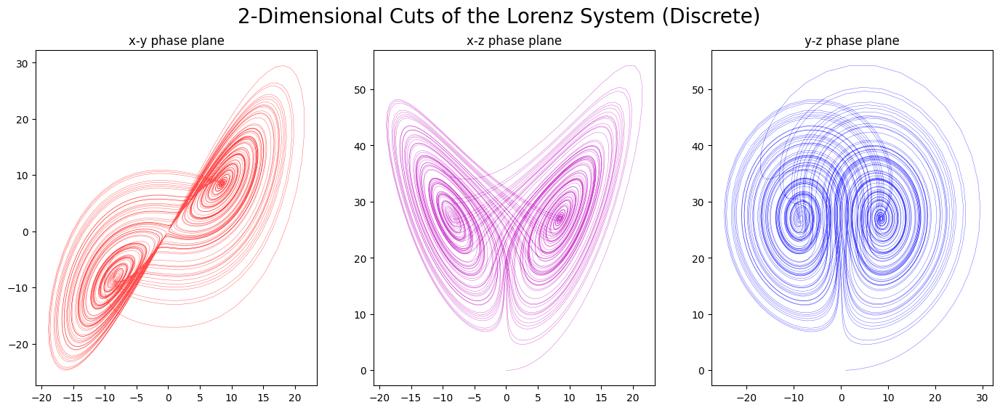

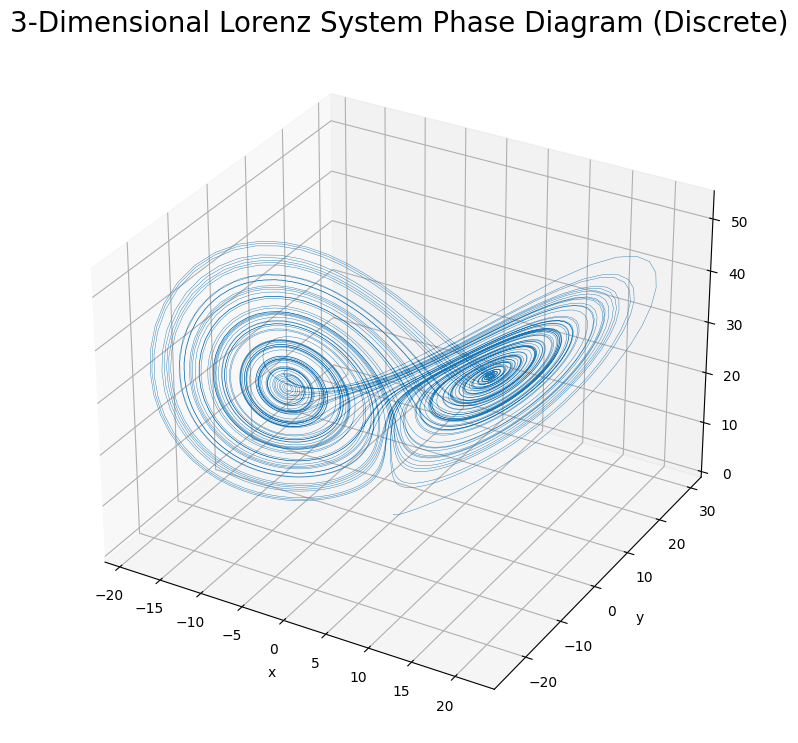

In [372]:
# Lorenz Attractor
TIMESTEPS = 10000
DT = 0.01
t = np.linspace(0, DT*TIMESTEPS, TIMESTEPS)

SIGMA = 10.0
RHO = 28
BETA = 8.0/3.0

params = {'timesteps': TIMESTEPS, 'initial_state': INITIAL_STATE, 'sigma': SIGMA, 'rho': RHO, 'beta': BETA, 'dt': DT}

x, y ,z = discrete_lorenz(**params)

# plot_variables(t, [x, y, z], DISCRETE)

The plot above presents the Lorenz attractor modeled in discrete time. The timestep $\Delta t$ is set to be $0.01$. A small timestep is required for the discrete model to accurately simulate the system, otherwise the $x$, $y$, and $z$ values can be computed to infinities at certain points and break the simulation. The unit of time is usually dimensionless for the Lorenz System, but it can be defined for a specific problem being studied. For example, $0.01$ can represent a fraction of a day, which equates to about 14 minutes. This timestep is often used to model the atmospheric behavior in weather forecasting, as it is balanced between accuracy and computational efficiency.

The discrete model was able to model the general shape of the Lorenz Attractor. However, it is worth noting that the trajectories plotted seem more condensed and randomly spaced. This model also depicts the trajectories closing in on the two fixed points $C_P$ and $C_N$ (denoting the fixed point in the positive[x, y] and negative[-x, -y] coordinates respectively - the two centers of the manifolds). Given the timestep and number of iterations, the trajectories should in theory never get this close, almost as if they are trying to approach a steady state. The Lorenz Attractor is a strange chaotic attractor that does not have a steady state. The details of this attractor will be further discussed below under the continuous model.

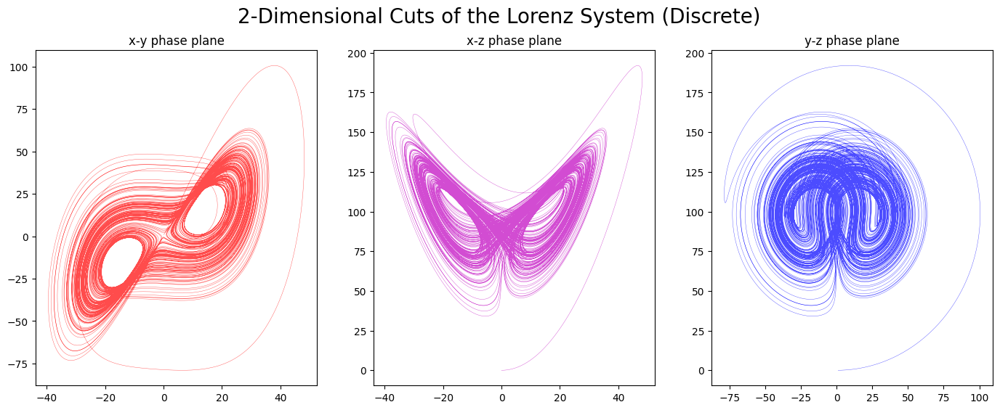

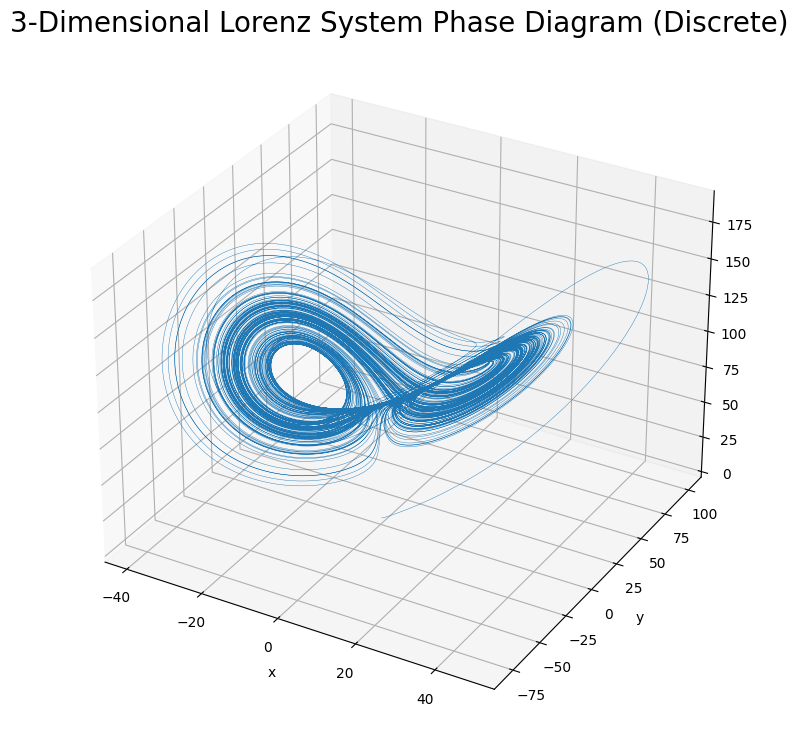

In [373]:
TIMESTEPS = 100000
DT = 0.001
t = np.linspace(0, DT*TIMESTEPS, TIMESTEPS)

SIGMA = 10.0
RHO = 99.65
BETA = 8.0/3.0

params = {'timesteps': TIMESTEPS, 'initial_state': INITIAL_STATE, 'sigma': SIGMA, 'rho': RHO, 'beta': BETA, 'dt': DT}

x, y, z = discrete_lorenz(**params)
# plot_variables(t, [x, y, z], DISCRETE)

For this set of parameters above, $\sigma$ and $\beta$ have the same value as the Lorenz Attractor. As mentioned previously, $\rho$ has a critical value of around $24.74$. The value $99.65$, which is significantly greater than $24.74$, would therefore indicate an unstable system where strong convection takes place. However, for the Lorenz System, there is a periodic range of $\rho$ that displays periodic orbits in the form of period doublings. The $\rho$ value of $99.65$, will form a PPN-doubling orbit, which means that the trajectory orbits around the fixed point $C_P$ twice before orbitting around the fixed point $C_N$ once (https://robert-doerner.de/en/Lorenz_system/lorenz_system.html). However, from the plot above, we can observe that the density of the trajectories are quite similar around both fixed points, and the bifurcation is not clearly simulated. 

The timestep used for this model was $0.001$, which is ten times smaller than the one used to plot the Lorenz Attractor. If a larger timestep was used, the model would be invalid due to calculated infinities and NaN issues. However, even with a smaller timestep, the discrete model is still unable to accurately simulate the periodic properties of these parameters, with one of the reasons being errors induced by rounding in the calculation of the next set of ($x$, $y$, $z$). With the Lorenz system's sensitivity to changes, the effects of these rounding errors induced by the discrete method gets dilated, producing less accurate models.

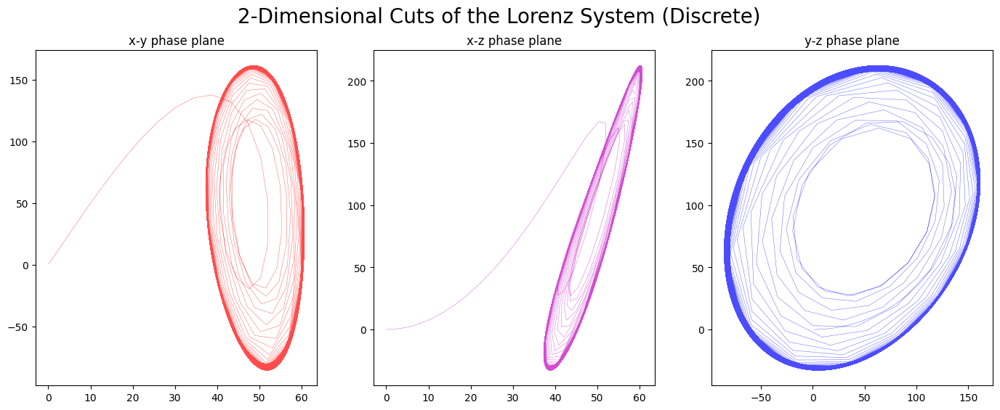

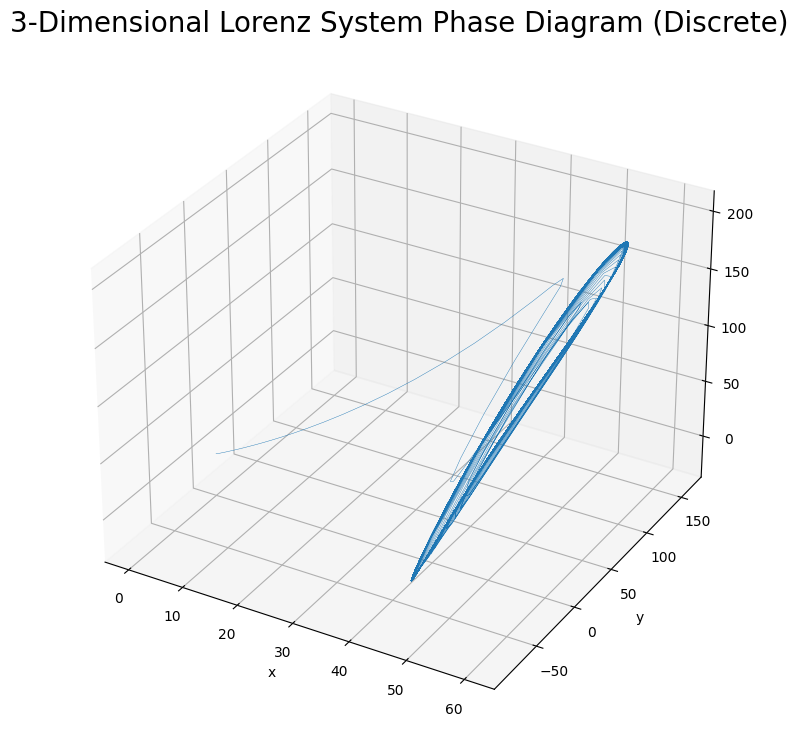

In [374]:
TIMESTEPS = 10000
DT = 0.01
t = np.linspace(0, DT*TIMESTEPS, TIMESTEPS)

SIGMA = 4.5
RHO = 98
BETA = 27

params = {'timesteps': TIMESTEPS, 'initial_state': INITIAL_STATE, 'sigma': SIGMA, 'rho': RHO, 'beta': BETA, 'dt': DT}

x, y, z = discrete_lorenz(**params)

Under the conditions $\sigma = 4.5$, $\rho = 98$, and $\beta = 27$, the Lorenz equations would model a system that has a high momentum diffusivity in a relatively larger space (compared to the Lorenz attractor.) With these values of $\sigma$ and $\beta$, the critical value of $\rho$ changes drastically. However, even without the exact value of the critcal value, we can see that the graph depicts a seemingly cyclic behavior. This would mean that the system is unstable and undergoes strong convective currents, but that is only if the discrete model correctly modelled this system under the timestep of $0.01$. We will now model this set of initial conditions under a smaller timestep.

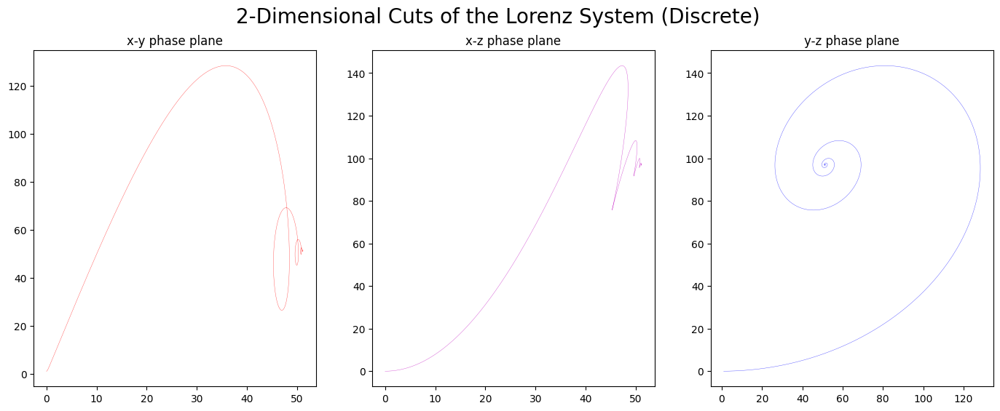

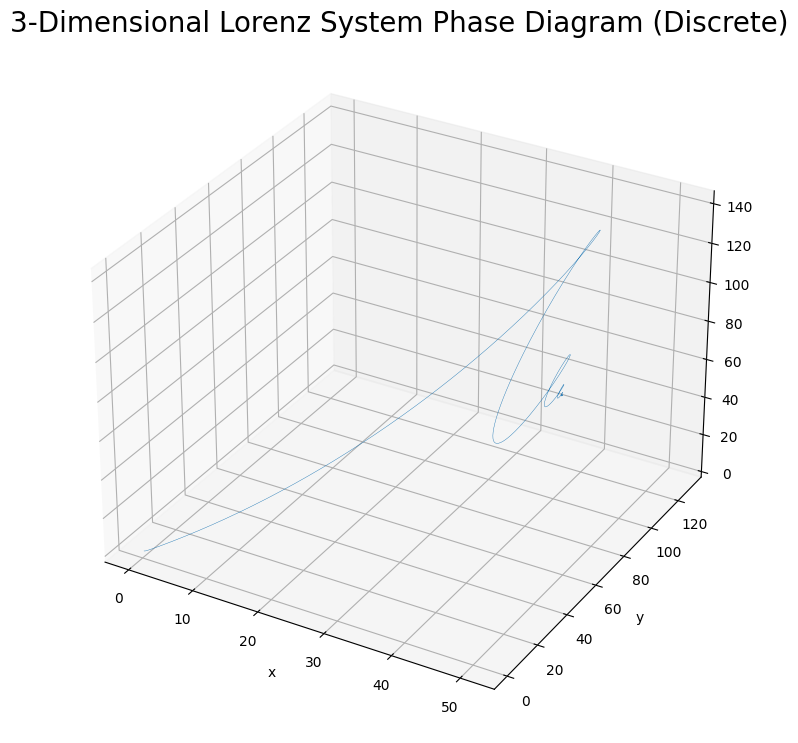

In [375]:
TIMESTEPS = 100000
DT = 0.001
t = np.linspace(0, DT*TIMESTEPS, TIMESTEPS)

SIGMA = 4.5
RHO = 98
BETA = 27

params = {'timesteps': TIMESTEPS, 'initial_state': INITIAL_STATE, 'sigma': SIGMA, 'rho': RHO, 'beta': BETA, 'dt': DT}

x, y, z = discrete_lorenz(**params)

# plot_variables(t, [x, y, z], DISCRETE)

As shown in this second model above, the system is completely different. This system now models what is seemingly a spiral towards some asymptotic point in the space. The cyclic behavior is no longer present, and the system is seemingly approaching some fixed point. This demonstrates two particular key concepts. One is the property of the system. Under these initial conditions, the system demonstrates a greater level of stability compared to the Lorenz Attractor. A more periodic behavior of the system can be observed from the model. This can be credited to the smaller value of $\sigma$, which scales to a lower rate of convection and indicates a decrease in the system's ability to carry momentum.

The other key concept this model depicts, along with its predecessor in a greater timestep, is the limitation of the discrete model. As shown previously, a timestep of $0.01$ generated an inaccurate model of the system that showed a cyclic and almost repetative behavior. Due to the Lorenz system's sensitivity to inital conditions and the periodic behavior of this particular system, a smaller timestep is required to accurately capture these properties. In the case of the Lorenz system, a smaller timestep means whichever application this model is used to predict can only be accurate up til an even shorter range of time while requiring greater computational power.

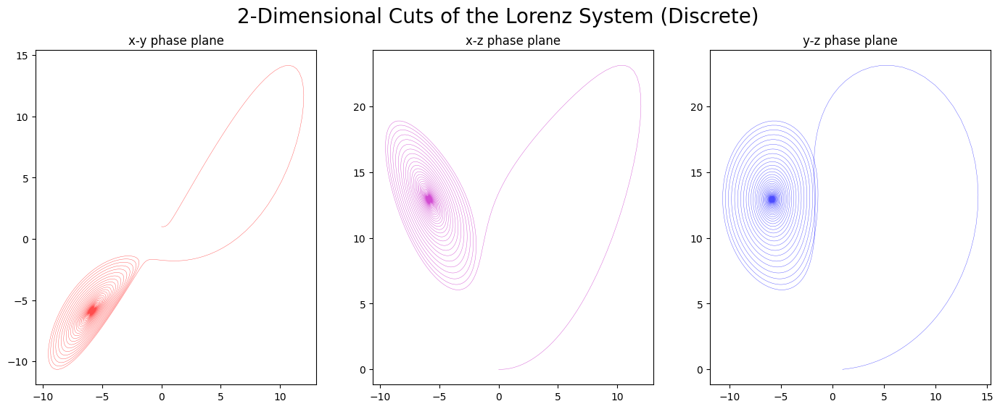

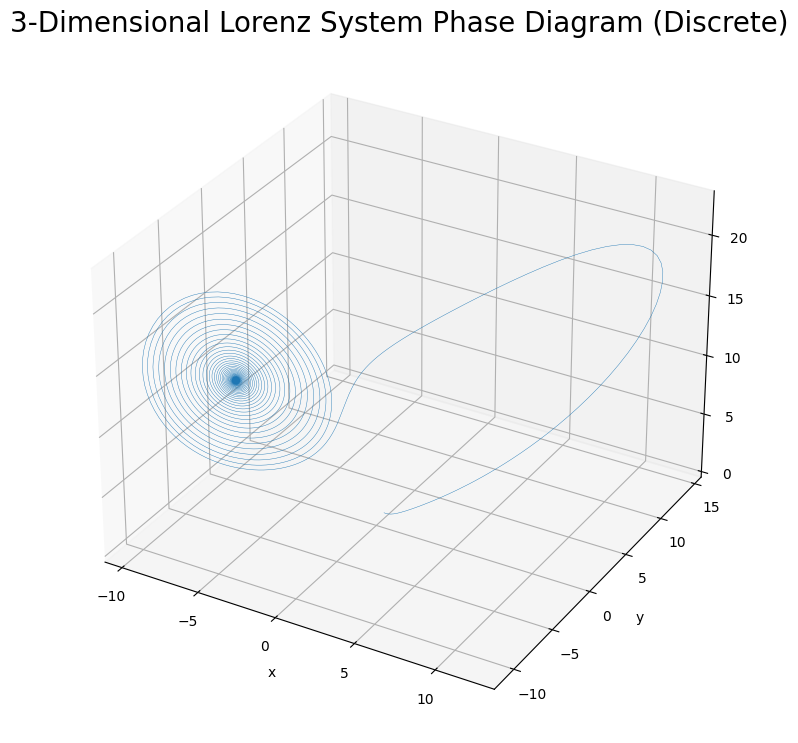

In [376]:
TIMESTEPS = 10000
DT = 0.01
t = np.linspace(0, DT*TIMESTEPS, TIMESTEPS)

SIGMA = 10.0
RHO = 13.926
BETA = 8.0/3.0

params = {'timesteps': TIMESTEPS, 'initial_state': INITIAL_STATE, 'sigma': SIGMA, 'rho': RHO, 'beta': BETA, 'dt': DT}

x, y, z = discrete_lorenz(**params)
# plot_variables(t, [x, y, z], DISCRETE)

For this model, the values of $\sigma$ and $\beta$ are once again the same as those of the Lorenz Attractor, for which the critical value of $\rho$ is known. The value of $\rho$ for this model is $13.926$, less than $24$. As discussed previously, this means that the model is stable and approaches some steady state. As shown in the plots above, we can see that the trajectory starts with a large orbit around some fixed point $C_P$ before spiralling uniformly towards a stable fixed point $C_N$. This means that for this dynamical system, conduction is the main mechanism of heat transfer. So even though $\sigma$ has a high value (>>1) that indicates high rate of convection, since convection is not dominant in this system, the rate of convection will not destabilize the system. 

As for the capabilities of the discrete model, the model is sufficient in plotting the stable nature of the system. However, its accuracy seems to be askew around the steady state fixed point $C_N$, where the trajectories kind of merge together.

### Change in Initial States

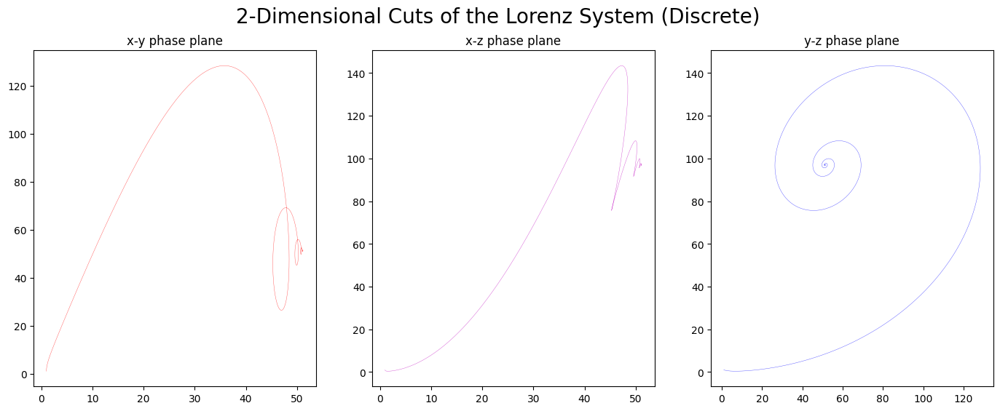

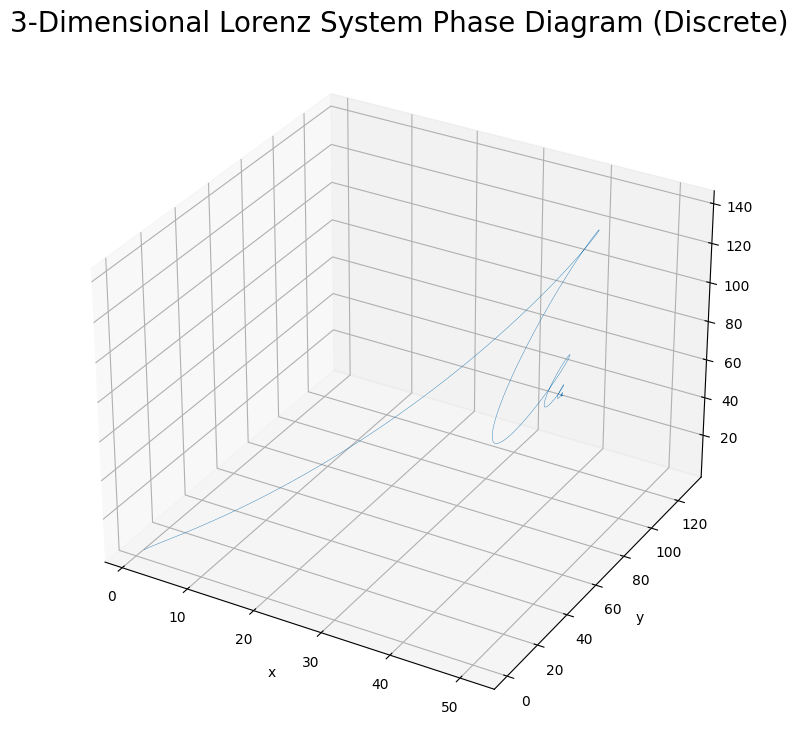

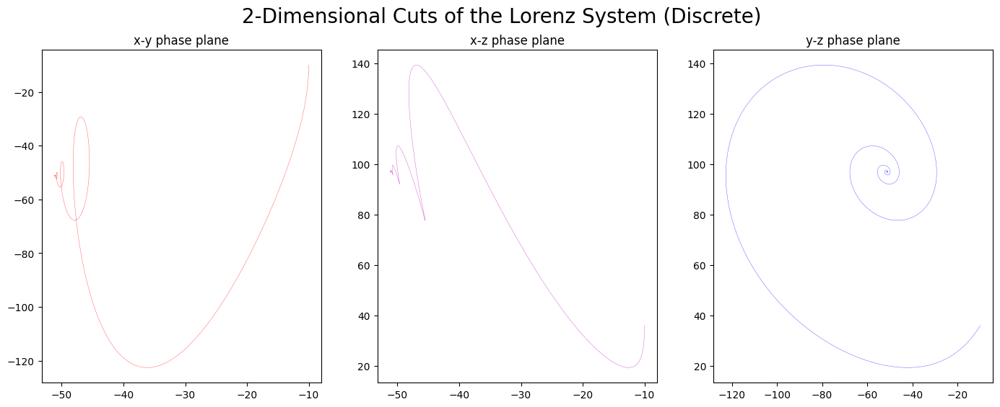

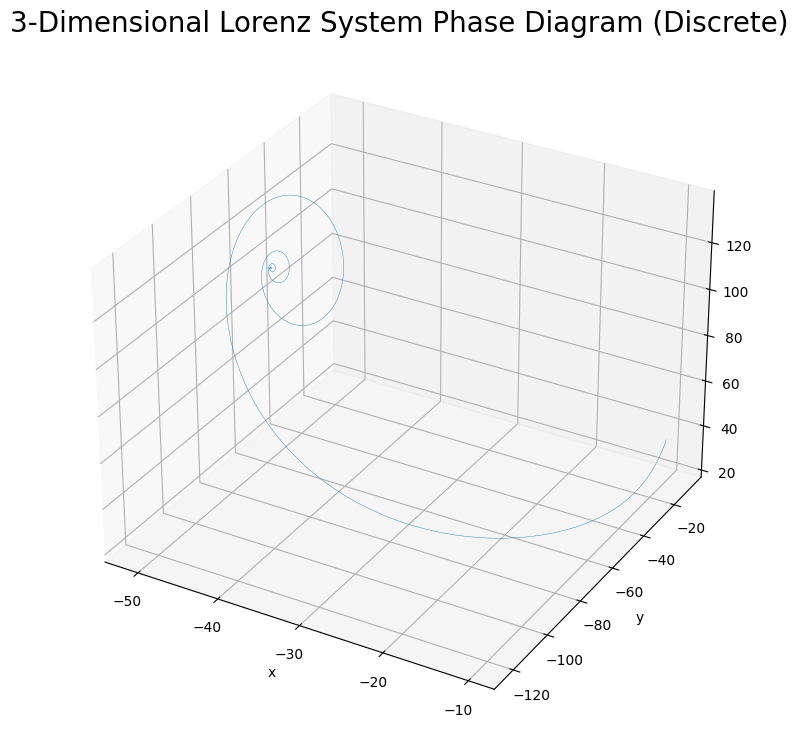

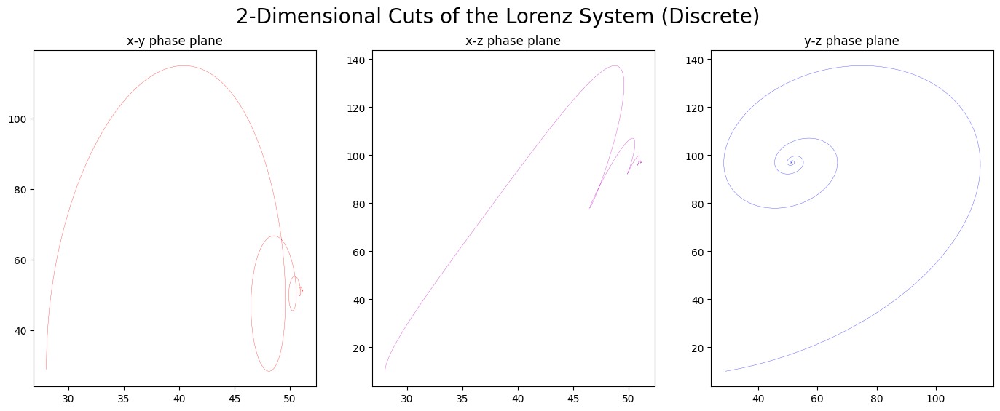

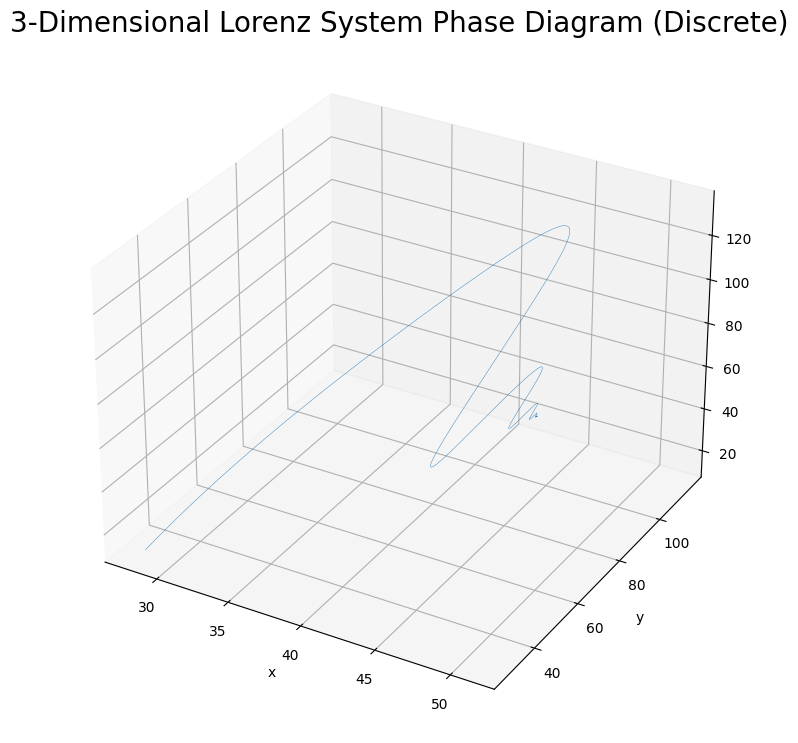

In [377]:
TIMESTEPS = 100000
DT = 0.001
t = np.linspace(0, DT*TIMESTEPS, TIMESTEPS)

SIGMA = 4.5
RHO = 98
BETA = 27

initial_state1 = (1, 1, 1)
initial_state2 = (-10, -10, 36)
initial_state3 = (28, 29, 10)

params1 = {'timesteps': TIMESTEPS, 'initial_state': initial_state1, 'sigma': SIGMA, 'rho': RHO, 'beta': BETA, 'dt': DT}
params2 = {'timesteps': TIMESTEPS, 'initial_state': initial_state2, 'sigma': SIGMA, 'rho': RHO, 'beta': BETA, 'dt': DT}
params3 = {'timesteps': TIMESTEPS, 'initial_state': initial_state3, 'sigma': SIGMA, 'rho': RHO, 'beta': BETA, 'dt': DT}

x1, y1, z1 = discrete_lorenz(**params1)
x2, y2, z2 = discrete_lorenz(**params2)
x3, y3, z3 = discrete_lorenz(**params3)

# plot_variables(t, [x, y, z], DISCRETE)

The first observation that can be made is that, given the three different initial states, the general spiral shape of the model does not change because the parameters are the same. This shows that given a small enough timestep, the discrete model would still be able to periodically converge towards some point in space despite the starting position. An interesting feature worth noting is that for the first and third set of initial states, where $x$ and $y$ are positive, the point of convergence is around when $x\approx 53, y\approx 50$ and $z\approx 95$. However, the point of convergence for the second set of initial states, where $x$ and $y$ are negative, is around when $x\approx -53, y\approx -50$ and $z\approx 95$. These models thus demonstrate the property of symmetry in the Lorenz System.

Even though the trajectory seems to be converging towards a steady state, the system is actually still chaotic as it experiences high momentum diffusivity in a large space. The critical value for $\rho$ can actually be calculated by the equation $r_H = |\frac{\sigma(3+\beta+\sigma)}{\sigma-\beta+1}|$ (https://www.vibrantcleanenergy.com/wp-content/uploads/2017/07/Dynamics-of-the-Lorenz-Equations.pdf), where $r_H$ stands for the horizontal thermal Rayleigh Number, the critical value. By plugging the values of $\sigma$ and $\beta$ into this equation, we get that the critical value for $\rho$ is around $6.6$. Since $98$ is significantly greater than this value, the system is unstable and in reality there would be an asymptotic point of convergence that the system will never reach.

### Part 3 (6 marks) - Continuous Time Modelling

Let's see what happens if we move into continous time now. Express your system as a set of differential equations and once again, simulate the behaviour of your system. 

Do so for;
* multiple initial conditions
* multiple sets of model parameters
* at least two diferential equation solvers, including an RK2 implementation that should be included in this submission. 

Plot and explain your results, and be sure to point out any differences between discrete and continuous time that you notice. 


The differential equations defining the Lorenz System are as such:

$\frac{dx}{dt} = \sigma(y-x)$

$\frac{dy}{dt} = x*(\rho-z)-y$

$\frac{dz}{dt} = x*y-\beta*z$

In [378]:
TIMESTEPS = np.linspace(0, 100, 10000)  # equivalent to a timestep of 0.01
ODEINT = "ODEInt"
RK2 = "RK2"

def generate_differential_equations(current_state, t):
    x, y, z = current_state

    dxdt = SIGMA * (y - x)
    dydt = x * (RHO - z) - y
    dzdt = x * y - BETA * z

    return dxdt, dydt, dzdt    
    

def solve_by_odeint(timesteps, initial_state):
    xyz = odeint(generate_differential_equations, initial_state, timesteps)

    x = xyz[:, 0]
    y = xyz[:, 1]
    z = xyz[:, 2]

    return x, y, z

    
def lorenz_generator(sigma, rho, beta):
    dxdt = lambda t, xyz: sigma * (xyz[1] - xyz[0])
    dydt = lambda t, xyz: xyz[0] * (rho - xyz[2]) - xyz[1]
    dzdt = lambda t, xyz: xyz[0] * xyz[1] - beta * xyz[2]

    dfdt = lambda t, xyz: np.array([dxdt(t, xyz), dydt(t, xyz), dzdt(t, xyz)])

    return dfdt


def rk2(df, y0, h, t0=0, a=1/2, t_max=100):
    b = 1-a
    alpha = 1/(2*b)
    beta = alpha
    y, t = y0, t0
    Y = np.array([y])
    T = [t]
    while t < t_max:
        k1 = df(t, y)
        k2 = df(t+alpha*h, y+beta*h*k1)
        y = y + h*(a*k1+b*k2)        
        t = t + h
        T.append(t)
        Y = np.vstack([Y, y])
    return T, Y


def solve_by_rk2(sigma, rho, beta, initial_state):
    h = 0.01
    LORENZ = lorenz_generator(sigma, rho, beta)
    a = 0.5
    
    t, lorenz = rk2(df=LORENZ, y0=initial_state, h=h, t0=0, a=a, t_max=100)

    x, y, z = lorenz[:, 0], lorenz[:, 1], lorenz[:, 2]

    plot_2d(x, y, z, RK2)
    plot_3d(x, y, z, RK2)

### Change in Initial Parameters

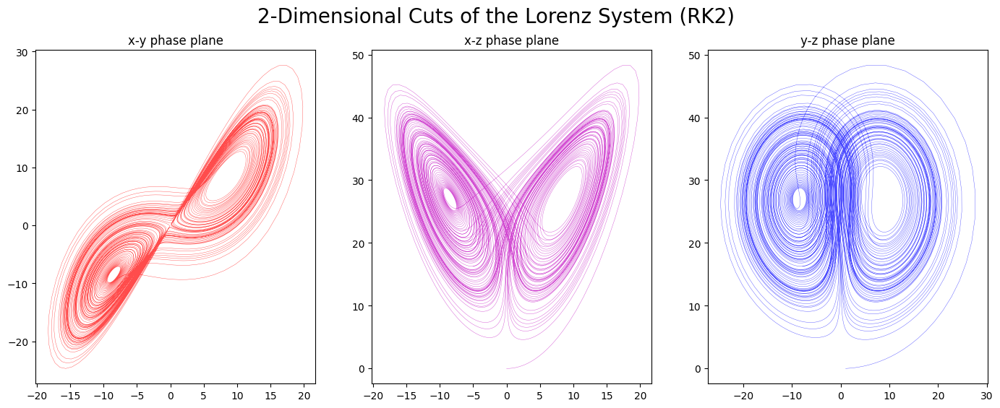

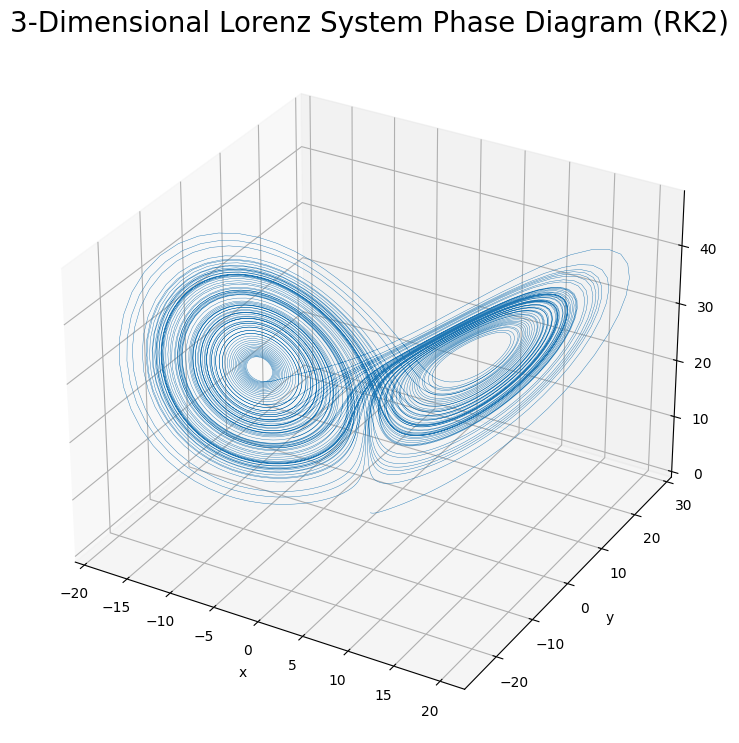

In [379]:
# Lorenz Attractor by RK2
SIGMA = 10.0
RHO = 28
BETA = 8.0/3.0
INITIAL_STATE = (0, 1, 0)

solve_by_rk2(SIGMA, RHO, BETA, INITIAL_STATE)


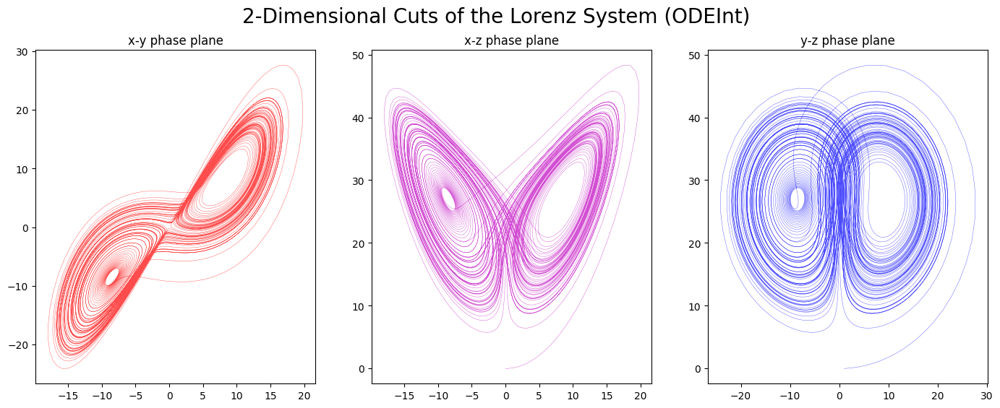

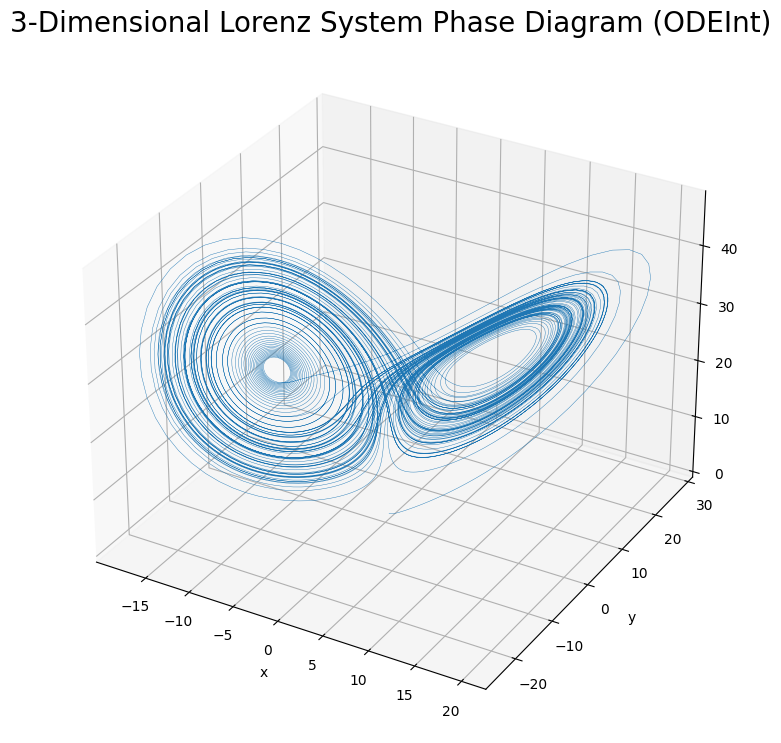

Values at the last timestep:  (-15.099049936841253, -15.00933003872803, 36.07368342497325)


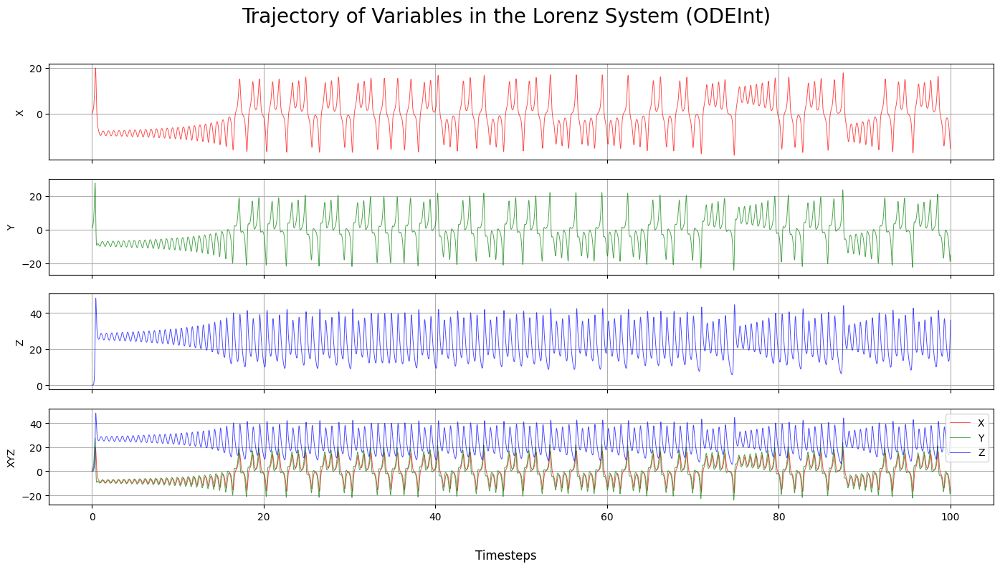

In [380]:
# Lorenz Attractor by ODEInt
SIGMA = 10.0
RHO = 28
BETA = 8.0/3.0
INITIAL_STATE = (0, 1, 0)

x, y , z = solve_by_odeint(TIMESTEPS, INITIAL_STATE)

plot_2d(x, y, z, ODEINT)
plot_3d(x, y, z, ODEINT)
plot_variables(TIMESTEPS, [x, y, z], ODEINT)


We can attempt to understand the Lorenz Attractor's behavior by first looking at the parameters. $\sigma$ has a value of $10$, which is considered a high Prandtl number $>> 1$. This means that momentum diffusivity (the ability of the fluid to transport momentum) is dominating over thermal diffusivity (the rate at which heat is transferred), so there would be a high rate of convection. $\rho$ has a value of 28. For the Lorenz System the Rayleigh Number $\rho$ has a critical value around $24.74$ (https://pubs.aip.org/aip/cha/article/29/6/063129/322122/A-physically-extended-Lorenz-system). This means that above $24.74$, convection becomes the dominating mechanism of heat transfer. Lastly, $\beta$ represents the ratio between the height and width of the space it is in.

Given these parameters, the initial conditions dictate the system to be undergoing strong convection with a great momentum diffusivity in a relatively small finite space. The result is a strange attractor, which has a fractal structure and exists in a non-integer dimension. The attractor consists of infinitely long curves in a finite space, so a trajectory will not visit any point in space more than once. 

From the plot of trajectories, we can observe the chaos in the paths each variable takes. There are no observable pattern in their trajectories. The chaotic nature of the model can be further explained by plotting two trajectories that start off very close to each other, and see how they change over time.

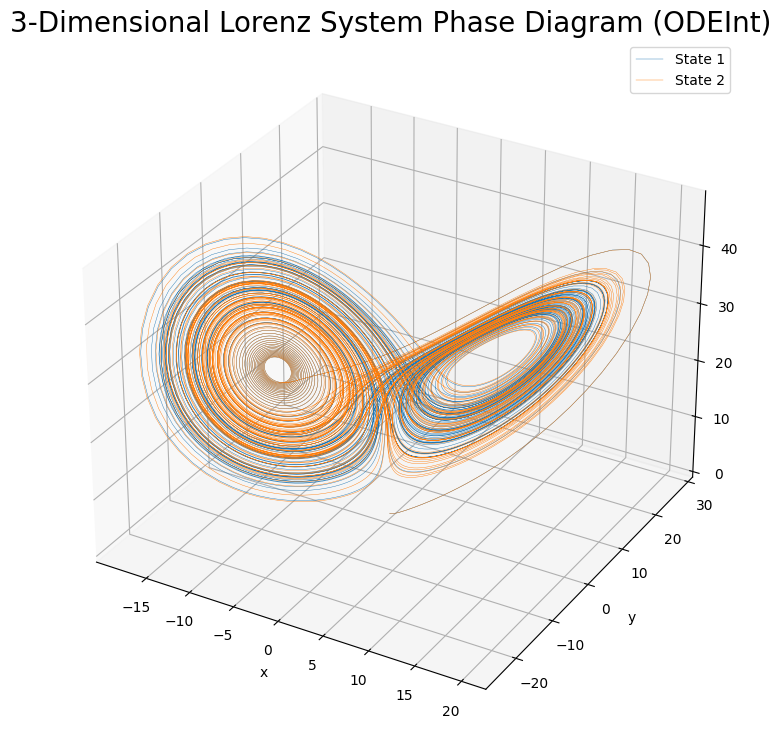

Values at the last timestep:  (32.61894711510151, 28.02643795338269, 7.416201423510536)


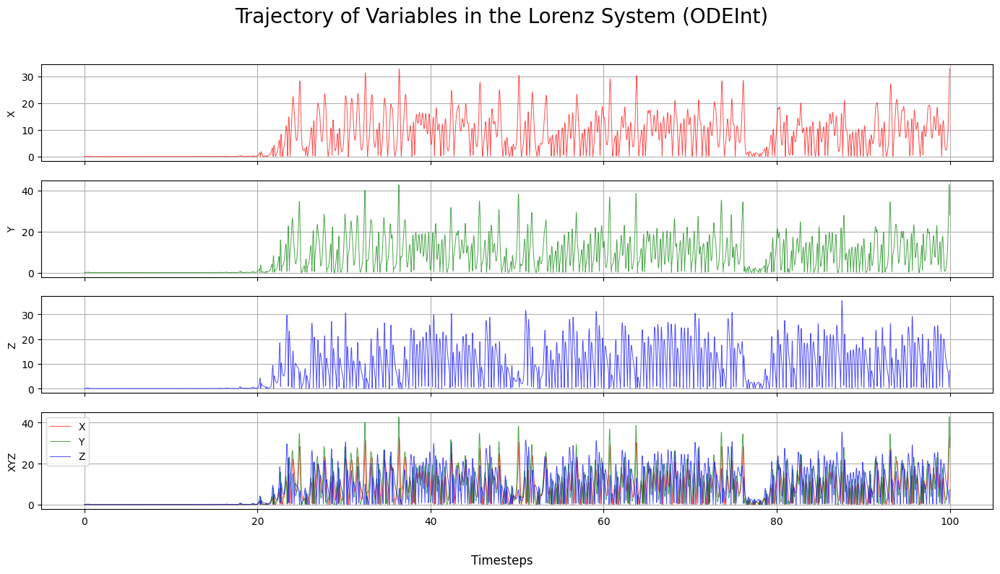

In [381]:
initial_state1 = (0, 1, 0)
initial_state2 = (0, 1.01, 0)

x1, y1, z1 = solve_by_odeint(TIMESTEPS, initial_state1)
x2, y2, z2 = solve_by_odeint(TIMESTEPS, initial_state2)

plot_double([x1, x2], [y1, y2], [z1, z2], ODEINT)
plot_variables(TIMESTEPS, [abs(x1-x2), abs(y1-y2), abs(z1-z2)], ODEINT)


The two initial states start off with just a difference of 0.01 in the y-axis. The trajectory of variables plotted is the difference in their values at each timestep. At first, we can see that there aren't much difference in their trajectories. However, at around the $20^{th}$ timestep, the points start to diverge onto completely different paths. Hence, the Lorenz attractor exhibits chaos.

The Lorenz Attractor is often used in weather prediction, and this model explains exactly why weather prediction is so difficult over a longer period of time. If $x$, $y$, and $z$ each represent an aspect/variable of the weather, the slightest change in the starting condition will eventually evolve into a completely different trajectory and a completely different prediction. And in reality, the initial condition will never be exactly the same, that is, to infinite decimal places. While this model is a drastic oversimplification for weather prediciton, the sensitivity to initial conditions is well-exhibited.

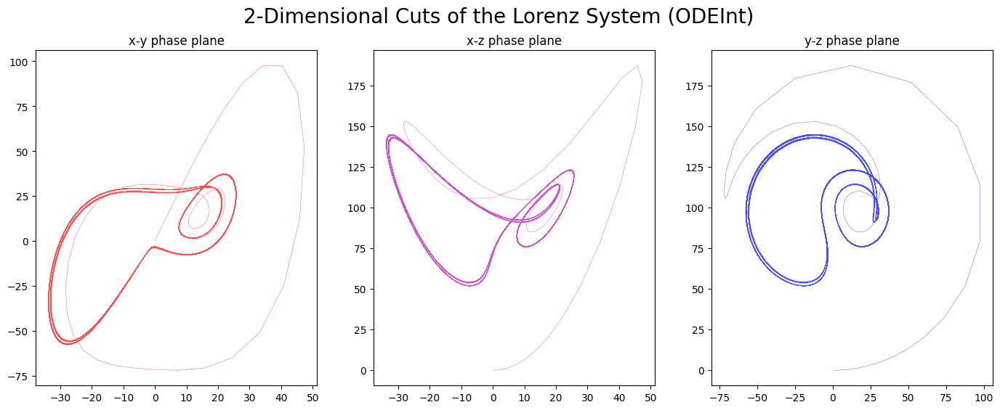

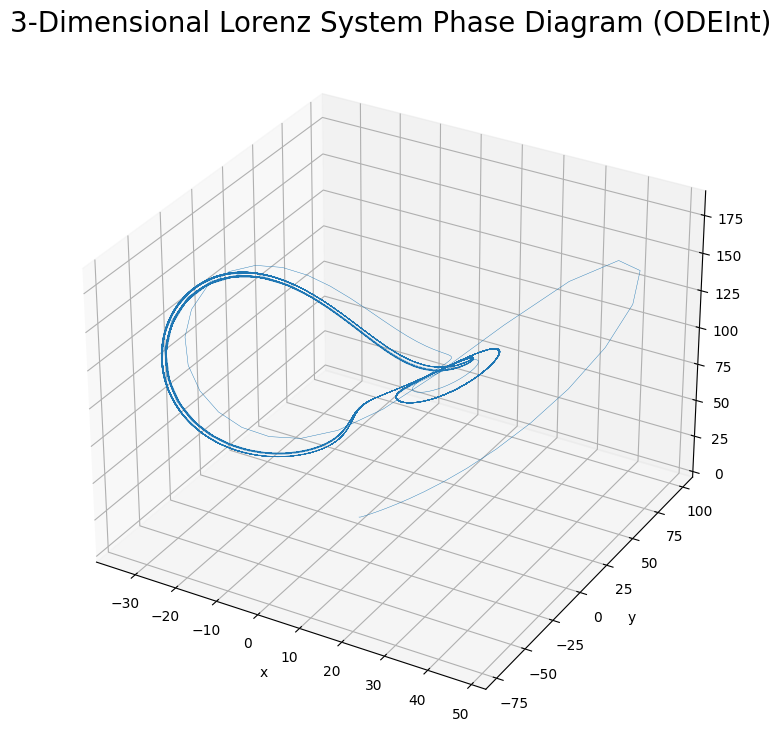

Values at the last timestep:  (13.021961865068045, 29.97110454012289, 93.99123284826398)


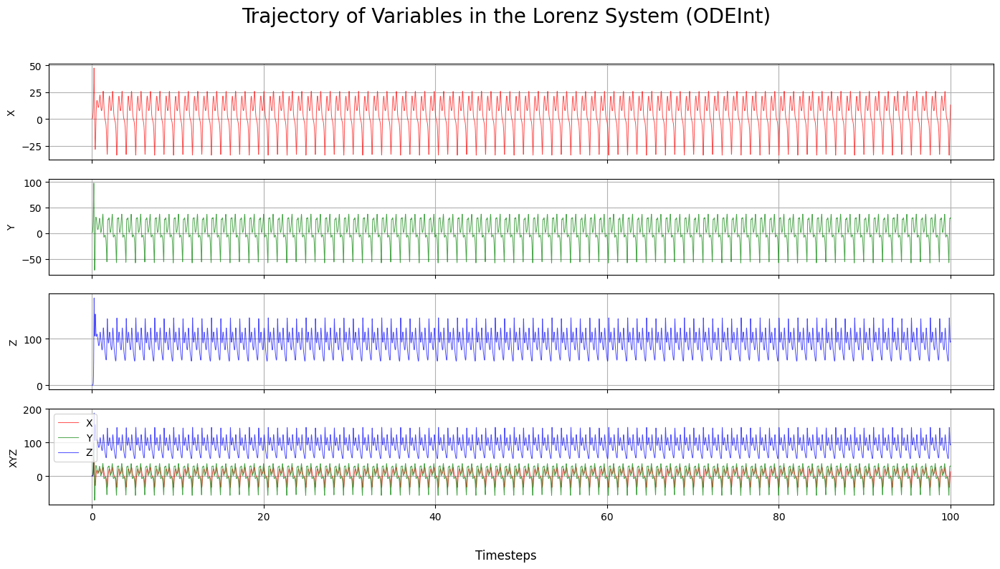

In [382]:
SIGMA = 10.0
RHO = 99.65
BETA = 8.0/3.0
INITIAL_STATE = (0, 1, 0)

x, y, z = solve_by_odeint(TIMESTEPS, INITIAL_STATE)

plot_2d(x, y, z, ODEINT)
plot_3d(x, y, z, ODEINT)
plot_variables(TIMESTEPS, [x, y, z], ODEINT)


Contrary to the discrete model for this set of initial parameters, the continuous model now displays a clear period-doubling pattern that can be observed more clearly in the y-z phase plane. As mentioned previously, the Lorenz System has a periodic range of $\rho$ that displays periodic orbits in the form of period-doublings. For this model, we can observe the PPN-doubling. As the trajectory orbits around the fixed point $C_P$ twice, before orbitting around the fixed point $C_N$ once. As a reminder, the fixed points $C_P$ and $C_N$ refer to the centers of the manifolds, where one is positive in both the x and y axes and one is negative in both the x and y axes. We can also see, from the plot of the variable dynamics, the periodic behavior of the system as a pattern emerges for each variable.

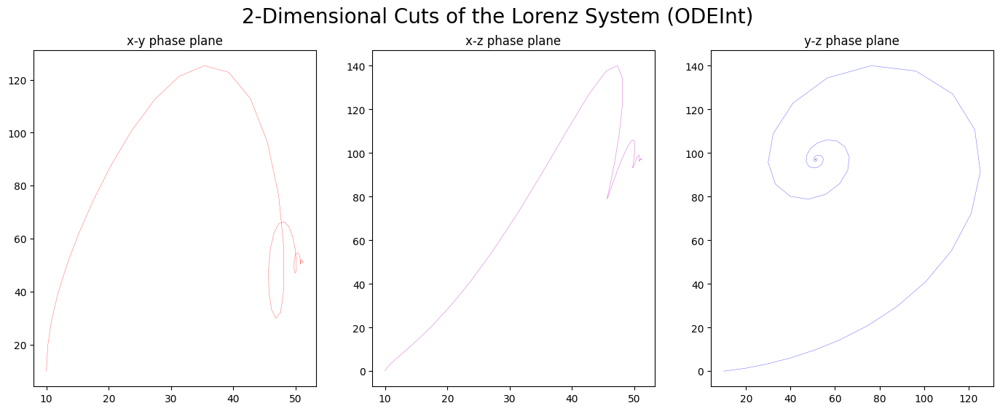

Values at the last timestep:  (51.17616632769594, 51.17616632769594, 97.0)


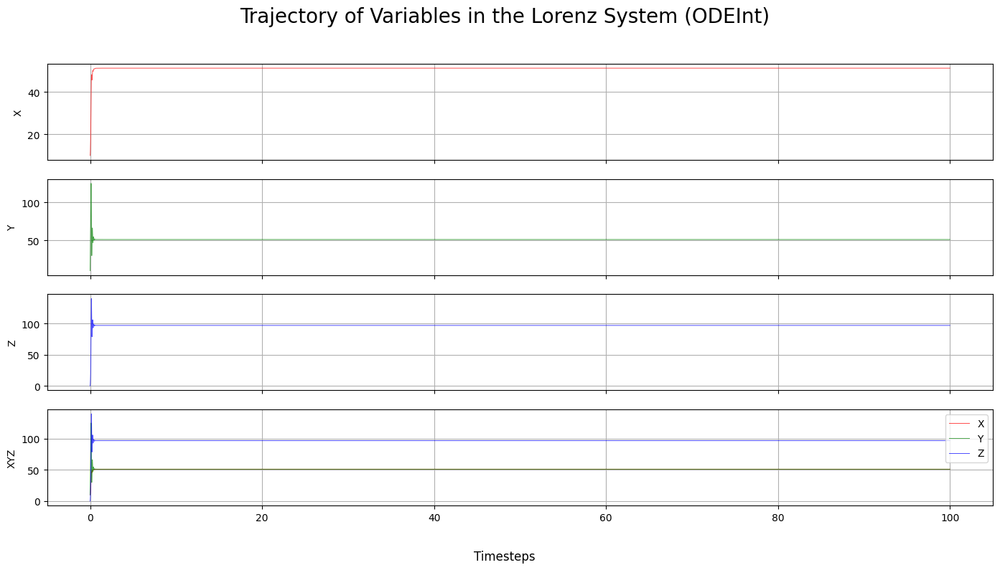

In [383]:
SIGMA = 4.5
RHO = 98
BETA = 27
INITIAL_STATE = (10, 10, 0)

x, y, z = solve_by_odeint(TIMESTEPS, INITIAL_STATE)

plot_2d(x, y, z, ODEINT)
plot_variables(TIMESTEPS, [x, y, z], ODEINT)

With this set of parameters, as mentioned previously, the system undergoes high momentum diffusivity in a relatively large space. Recall that the critical value of $\rho$ for this system is around $6.6$, via the equation $r_H = |\frac{\sigma(3+\beta+\sigma)}{\sigma-\beta+1}|$. Under the continuous model, the system continues to demonstrate the periodic sprial towards an asymptotic point of convergence due to the chaotic nature of this model. 

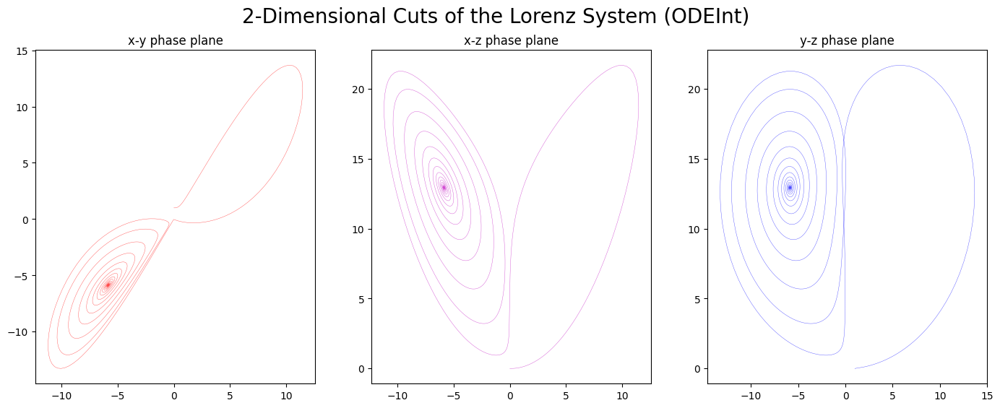

In [384]:
SIGMA = 10.0
RHO = 13.926
BETA = 8.0/3.0
INITIAL_STATE = (0, 1, 0)

x, y, z = solve_by_odeint(TIMESTEPS, INITIAL_STATE)

plot_2d(x, y, z, ODEINT)

Since the values $\sigma = 10$ and $\beta=\frac{8}{3}$ produce a critical value of $\rho$, $r_h$, $24.74$, we know this system is stable because the value of $\rho$ is $13.926$. As such, we can clearly observe the stable fixed point, the steady state, at $C_N$, for the same reason as discussed in the discrete model. In comparison to the discrete model of this system, the trajectory around the steady state is much more distinct and clearly distinguished as the continuous model is able to plot the system more accurately, with a smaller margin of error.

### Change in Initial States

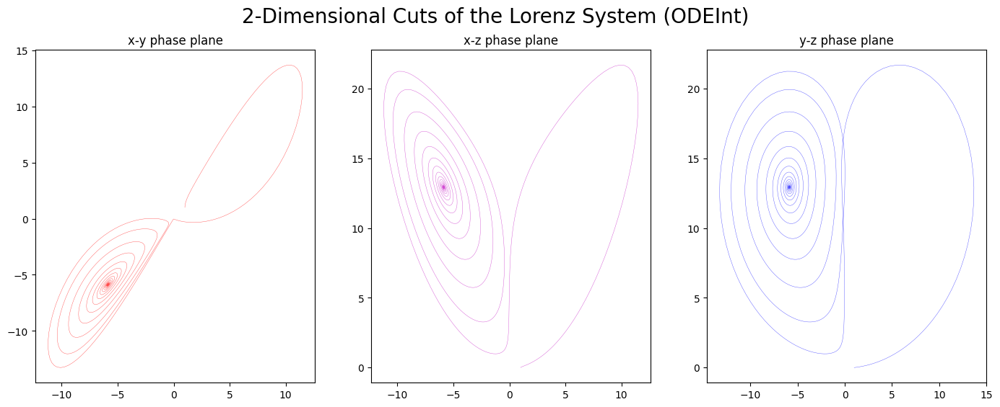

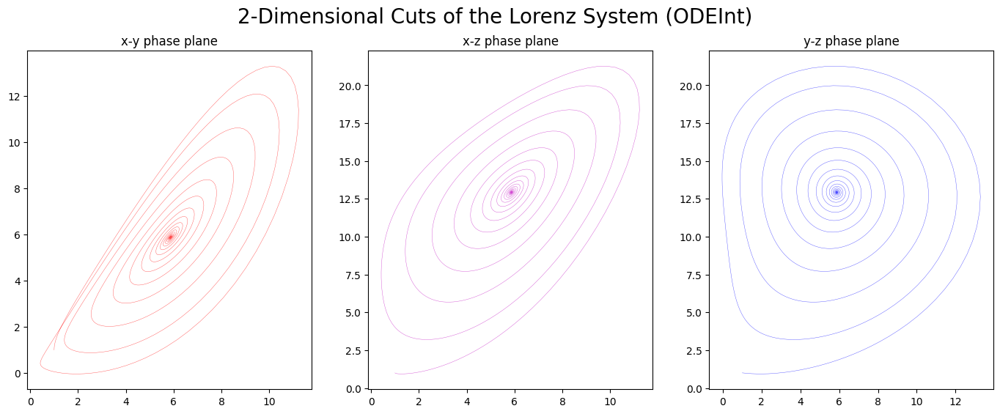

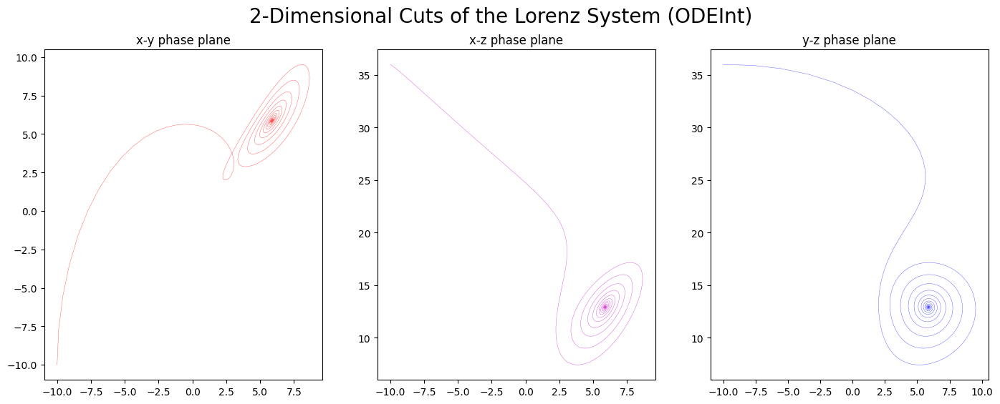

In [385]:
SIGMA = 10
RHO = 13.926
BETA = 8/3

initial_state1 = (1, 1, 0)
initial_state2 = (1, 1, 1)
initial_state3 = (-10, -10, 36)

x1, y1, z1 = solve_by_odeint(TIMESTEPS, initial_state1)
x2, y2, z2 = solve_by_odeint(TIMESTEPS, initial_state2)
x3, y3, z3 = solve_by_odeint(TIMESTEPS, initial_state3)

plot_2d(x1, y1, z1, ODEINT)
plot_2d(x2, y2, z2, ODEINT)
plot_2d(x3, y3, z3, ODEINT)

For the analysis of the effects of changing the initial state, the parameters of the Lorenz System that is known to be stable are used. The first property we can observe is that the steady state for the first model and the second model are mirrored, where the first model has a steady around when $x\approx-6, y\approx-6$, and $z\approx12.5$, and the second model has a steady state when $x\approx 6, y\approx 6$, and $z\approx12.5$. Initial state 1 and initial state 2 have only a difference of $1$ in the z-axis. However, this difference is enough to send the second trajectory towards the other fixed point $C_P$.

The third model also has a steady state when $x\approx 6, y\approx 6$, and $z\approx12.5$. We can see from this set of models that, regardless of the initial state, the system will always head towards a steady state becuase $\rho$ is below its critical value. In terms of the physical system, this means that even though there is a high rate of convection, convection is not the dominant heat-transfer mechanism, but instead conduction. Therefore, the high rate of convection that is assumed to be a constant will not create chaos in the system.

We can also observe the symmetry of the steady states around $C_P$ and $C_N$ in a double plot below.

The analysis of the stability and steady states of the Lorenz System will be discussed under part 5.

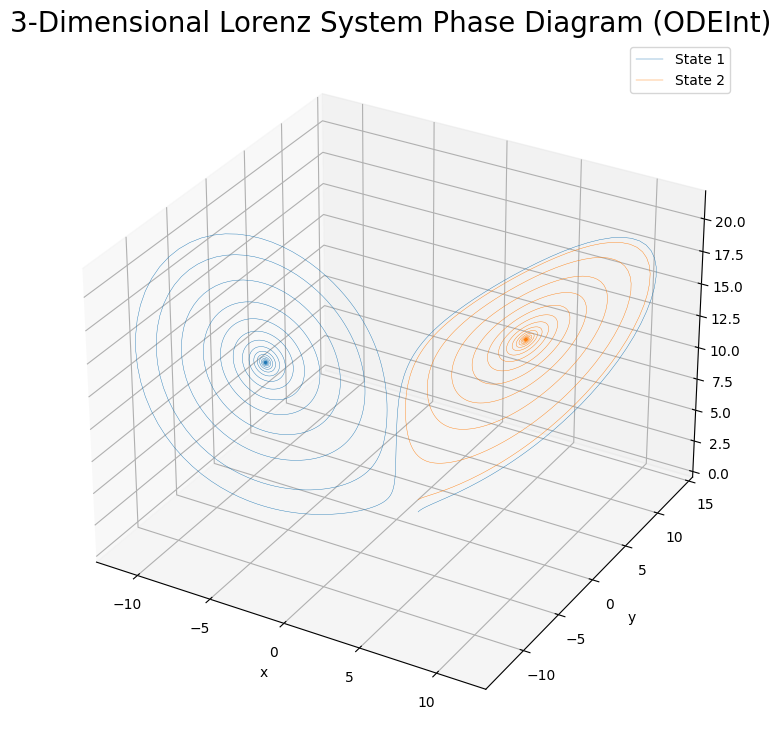

In [386]:
plot_double([x1, x2], [y1, y2], [z1, z2], ODEINT)

### Part 4 (6 marks) - Stochastic Modelling

Until now we have assumed that all events occur deterministically. Lets add some randomness to our system and see what happens. 

Implement a Gillespie Algorithm version of your solver and simulate the behaviour of your system. 

As usual, make sure to do so for multiple sets of initial conditions and model parameters. 

Plot and explain your results. In particular, how does the addition of randomness affect your results? 


In [387]:
# Code from Week 8 Workshop
def gillespie(events, event_consequences, Y0, t0, t_max=100):
    y, t = Y0, t0
    Y, T = np.array(Y0), [t]
    while t<t_max:
        p = propensities(t, y, events=events)
        p_rel = p/sum(p)
        tte = [time_to_event(p[i]) for i in range(len(p))]
        idx = np.random.choice(range(len(p)), p=p_rel)
        event, dt = event_consequences[idx], tte[idx]
        y = event(t, y)
        t += dt    
        T += [t]
        Y = np.vstack([Y, y])

    return T, Y

time_to_event = lambda p: (-1/p)*np.log(np.random.random())

def propensities(t, y, events):
    e_ = []
    for event in events:
        e = event(t=t, xyz=y)
        e_.append(e)
    return e_

To distinguish each event in the system, it can be expanded as such:

$\frac{dx}{dt} = \sigma*y - \sigma*x$

$\frac{dy}{dt} = \rho*x - x*z - y$

$\frac{dz}{dt} = x*y-\beta*z$

### Events

It is important to note that most individual components of the Lorenz System does not have a well-defined physical property. Rather, they often each describe an interaction between two factors of the system. All the variables are coupled with each other in some way so the effect of each component on the system is not as straightforward. As a result, the Gillespie Algorithm is not the most ideal way of modelling the Lorenz System stochastically. Furthermore, the consequences of each event aren't always proportional and would depend heavily on initial conditions as shown in the previous sections where the sensitivity of the Lorenz System is demonstrated. Nonetheless, the following will describe what each component in the Lorenz System describe.

$\sigma * y \to$ Effect of thermal diffusivity

$\sigma * x \to$ Effect of momentum diffusivity

$\rho * x \to$ Effect of buoyancy forces on the rate of fluid motion

$x * z \to$ Interaction between fluid motion and temperature distribution in the system

$y \to$ Difference between ascending and descending currents

$x*y \to$ Interaction between fluid motion and temperature

$\beta * z \to$ Vertical temperature differences at different vertical levels

We can now attempt to model the system with the Gillespie Algorithm by using relative effects and consequences. From previous plots of the variable dynamics, we can see that whenever $x$, $y$, or $z$ increase, the other variables also increase, just by a different magnitude, rate, and proportion. Hence, in our consequences, whenever one increase by 1, we can update the values of the others by the same amount. The same goes for when one decreases. At this point, we also need to set a condition so that $z$ never goes to or below 0 past the initial state. We will be using parameters for the Lorenz Attractor for this demonstration.

In [388]:
SIGMA = 10
RHO = 28
BETA = 8/3

thermal_diffusivity_p =     lambda t, xyz: SIGMA * xyz[1]
momentum_diffusivity_p =    lambda t, xyz: SIGMA * xyz[0]
buoyancy_fluid_p =          lambda t, xyz: RHO * xyz[0]
fluid_vtemp_p =             lambda t, xyz: xyz[0] * xyz[2]
horizontal_temp_p =         lambda t, xyz: xyz[1]
fluid_htemp_p =             lambda t, xyz: xyz[0] * xyz[1]
vertical_temp_p =           lambda t, xyz: BETA * xyz[2]

thermal_diffusivity_delta = lambda t, xyz:  np.array([xyz[0]+1, xyz[1]+1, xyz[2]+1])
momentum_diffusivity_delta = lambda t, xyz: np.array([xyz[0]-1, xyz[1]-1, xyz[2]-1 if xyz[2] > 2 else xyz[2]])
buoyancy_fluid_delta = lambda t, xyz:       np.array([xyz[0]+1, xyz[1]+1, xyz[2]-1 if xyz[2] > 2 else xyz[2]])
fluid_vtemp_delta = lambda t, xyz:          np.array([xyz[0]-1, xyz[1]-1, xyz[2]-1 if xyz[2] > 2 else xyz[2]])
horizontal_temp_delta = lambda t, xyz:      np.array([xyz[0]-1, xyz[1]-1, xyz[2]-1 if xyz[2] > 2 else xyz[2]])
fluid_htemp_delta =lambda t, xyz:           np.array([xyz[0]+1, xyz[1]+1, xyz[2]+1])
vertical_temp_delta = lambda t, xyz:        np.array([xyz[0]-1, xyz[1]-1, xyz[2]-1 if xyz[2] > 2 else xyz[2]])

events = [thermal_diffusivity_p, momentum_diffusivity_p, buoyancy_fluid_p, fluid_vtemp_p, horizontal_temp_p, fluid_htemp_p, vertical_temp_p]
event_consequences = [thermal_diffusivity_delta, momentum_diffusivity_delta, buoyancy_fluid_delta, fluid_vtemp_delta, horizontal_temp_delta, fluid_htemp_delta, vertical_temp_delta]

C:\Users\sean_\AppData\Local\Temp\ipykernel_39036\3816314028.py:18: RuntimeWarning: divide by zero encountered in long_scalars
  time_to_event = lambda p: (-1/p)*np.log(np.random.random())
C:\Users\sean_\AppData\Local\Temp\ipykernel_39036\3816314028.py:18: RuntimeWarning: divide by zero encountered in double_scalars
  time_to_event = lambda p: (-1/p)*np.log(np.random.random())


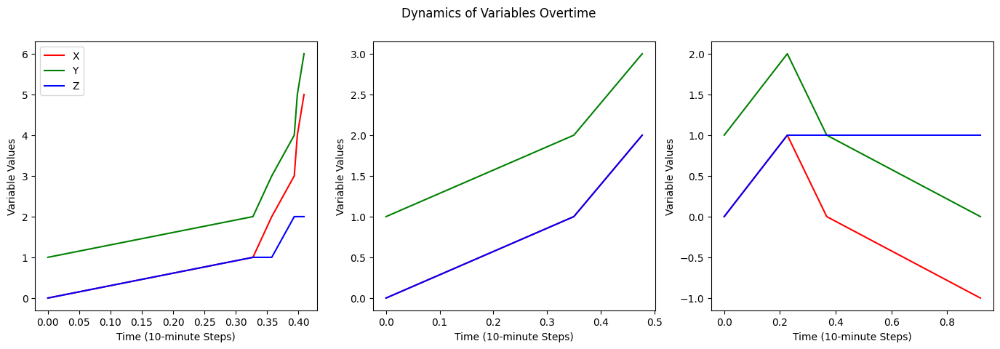

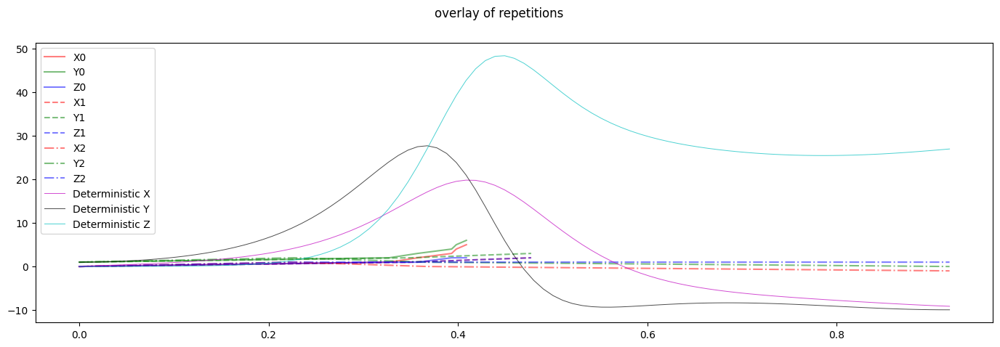

In [389]:
# Code from Week 8 Workshop
y0 = np.array([0, 1, 0])

reps = 3
fig, axs = plt.subplots(1, reps)
fig2, axs2 = plt.subplots(1)
fig.set_figwidth(17)
fig2.set_figwidth(17)
fig2.set_figheight(5)
t0=0

linestyles = ['-', '--', '-.']
colors = ['r', 'g', 'b']

t = []
for rep in range(reps):
    T, Y = gillespie(events, event_consequences, y0, t0, t_max=0.4)
    t.append(T[-1])
    names = ['X', 'Y', 'Z']
    for i in range(reps):
        axs[rep].plot(T, Y[:, i], label=names[i], c=colors[i])
        axs2.plot(T, Y[:, i], label=names[i]+str(rep), c=colors[i], linestyle=linestyles[rep], alpha=0.5)
    axs[rep].set_xlabel('Time (10-minute Steps)')
    axs[rep].set_ylabel('Variable Values')

TIMESTEPS = np.linspace(0, max(t), int(max(t)*100))
time = len(TIMESTEPS)
x, y, z = solve_by_odeint(TIMESTEPS, (0, 1, 0))

axs2.plot(TIMESTEPS, x[:time], color='m', alpha=0.7, linewidth=0.7, label="Deterministic X")
axs2.plot(TIMESTEPS, y[:time], color='k', alpha=0.7, linewidth=0.7, label="Deterministic Y")
axs2.plot(TIMESTEPS, z[:time], color='c', alpha=0.7, linewidth=0.7, label="Deterministic Z")

fig.suptitle('Dynamics of Variables Overtime')
axs[0].legend()

fig2.suptitle('overlay of repetitions')
axs2.legend()

With the Gillespie algorithm and our naive generalization of the event consequences, the maximum time $t_max$ needs to be an extremely small value. Otherwise, there exists the possibility that each component will scale into some extremely large value that is not possible for this system. This is also another limitation of the Gillespie Algorithm when used on the Lorenz System. The timestep of the Lorenz Attractor already represents a very short time frame, where 0.1 timestep would translate to around 10 minutes. However, because the magnitude of change for each variable is never dependent on a single component, it is very difficult to generate a stochastic model with the Gillespie Algorithm.

Running the code above can generate drastically different results. After running the code above a couple times, we can observe that in some iterations, the plot of the stochastic model follows the general gradient of the variable dynamics in the deterministic Lorenz System. However, due to the limited $t_max$, the model does not provide enough useful information in modelling the behavior of the model in the future, namely the chaotic behavior.

For each of the differential equation in the Lorenz System, an element of Guassian noise would be added as the stochastic term to simulate the element of randomness. This factor would be $A\xi_i|_{i = (x, y, z)}$, where $A$ is the noise amplitude and $\xi_i$ is the Gaussian white noise processes. For the purpose of stochastic modelling, the noise amplitude $A$ is assumed to be greater than 0. Furthermore, it can be demonstrated that the greatest contributions to the noises are from the variables $y$ and $z$ (https://users.math.yale.edu/users/sa563/Papers/WAWW_StoLorenz.pdf). Hence, we can simplify the equations and redefine the Lorenz System as such:

$\frac{dx}{dt} = \sigma(y-x)$

$\frac{dy}{dt} = x*(\rho-z)-y + \xi_y$

$\frac{dz}{dt} = x*y-\beta*z + \xi_z$

At this point there are a few assumptions that we need to make about this implementation.

The system will be modelled using a modified RK2 algorithm.

This is a naive implementation of introducing noise to the sytem, where the noise will be added directly to the values of $y$ and $z$, that is, after integrating the term $\xi_y$ and $\xi_z$ respectively. Therefore, the magnitude of noise added to each value would be $\xi_{y_{i}} * y_i$ and $\xi_{z_{i}} * z_i$ respectively.

The value of $\xi_y$ and $\xi_z$ will be equivalent for the purpose of this demonstration. Furthermore, they will remain constant and discrete, as the purpose of this demonstration is to discuss how any randomness or external factors can affect the trajectories in the sytem. The variation occur in that the final noise value can be subtracted or added to the system.

In [390]:
TIMESTEPS = np.linspace(0, 50, 5000)

def rk2_v2(df, y0, h, e, t0=0, a=1/2, t_max=100):
    b = 1-a
    alpha = 1/(2*b)
    beta = alpha
    y, t = y0, t0
    Y = np.array([y])
    T = [t]
    while t < t_max:
        k1 = df(t, y)
        k2 = df(t+alpha*h, y+beta*h*k1)
        y = [y[0] + h*(a*k1[0]+b*k2[0]), y[1] + h*(a*k1[1]+b*k2[1]) + [-e*y[1], e*y[1]][np.random.randint(0, 2)], y[2] + h*(a*k1[2]+b*k2[2]) + [-e*y[2], e*y[2]][np.random.randint(0, 2)]]
        t = t + h
        T.append(t)
        Y = np.vstack([Y, y])
    return T, Y


def solve_by_rk2_v2(sigma, rho, beta, e, initial_state):
    h = 0.01
    LORENZ = lorenz_generator(sigma, rho, beta)
    a = 0.5
    
    t, lorenz = rk2_v2(df=LORENZ, y0=initial_state, h=h, e=e, t0=0, a=a, t_max=50)

    x, y, z = lorenz[:, 0], lorenz[:, 1], lorenz[:, 2]

    plot_2d(x, y, z, RK2)
    plot_3d(x, y, z, RK2)
    plot_variables(TIMESTEPS, [x, y, z], RK2)

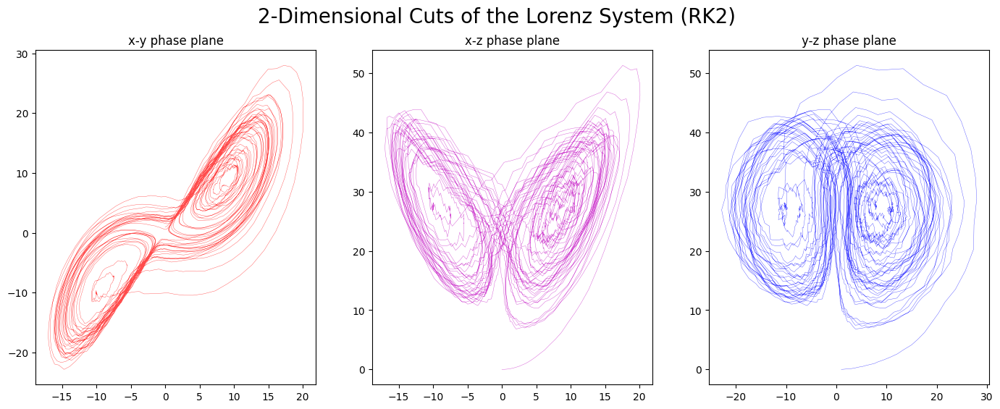

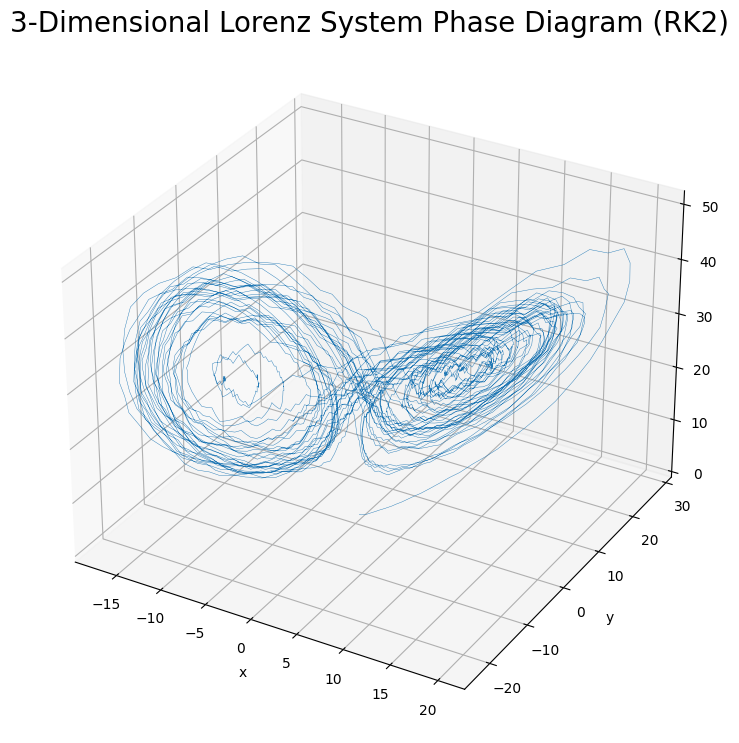

Values at the last timestep:  (-4.246793924259111, -6.147120226250492, 19.976718032674455)


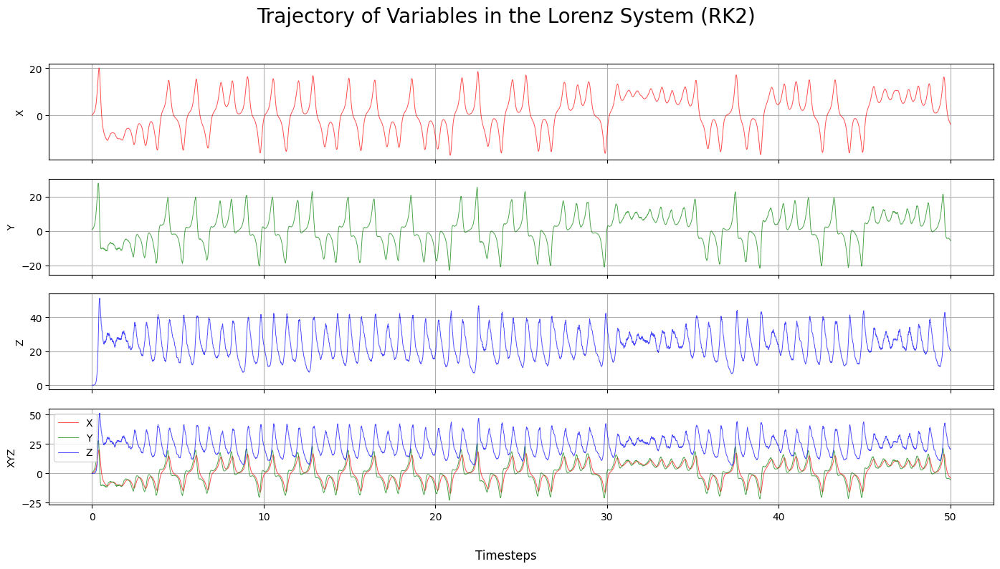

In [391]:
# Lorenz Attractor by RK2
SIGMA = 10.0
RHO = 28
BETA = 8.0/3.0
E = 0.02
INITIAL_STATE = [0, 1, 0]

solve_by_rk2_v2(SIGMA, RHO, BETA, E, INITIAL_STATE)

As the model shows, the trajectory now experiences a lot more variation. The aim of this model was to show how external sources can add an element of randomness to the system. The noise-induced Lorenz attractor can reflect on reality, going back to weather prediction, and how things like solar flare, radiation, or anything that is not considered by the systems of equations, can make the things even more unpredictable.

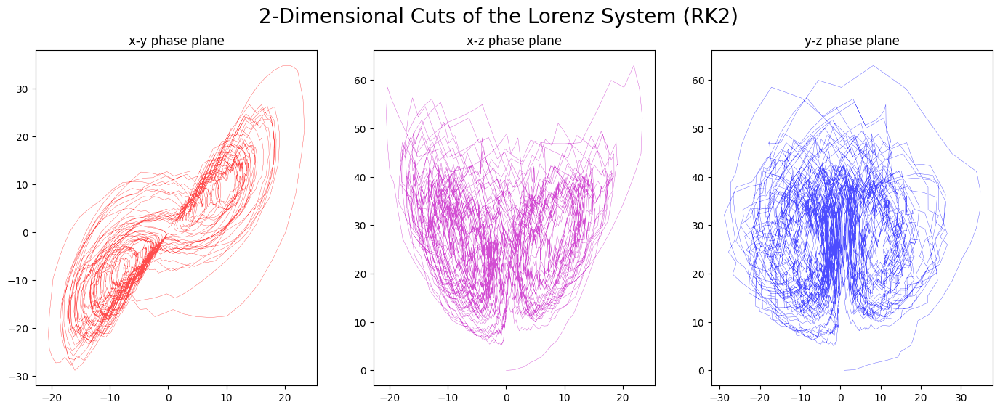

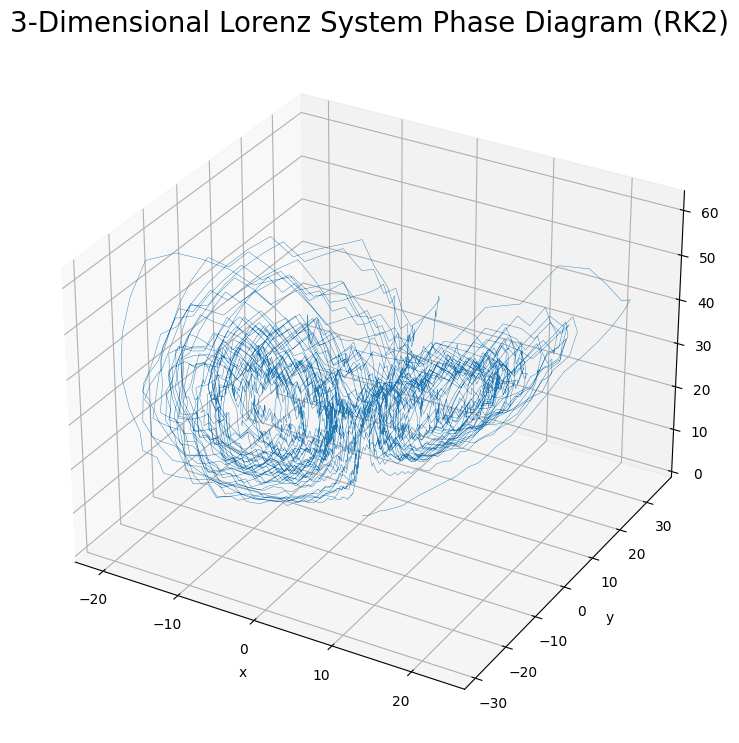

Values at the last timestep:  (-11.432014846913171, -21.311663901989398, 19.377201394263253)


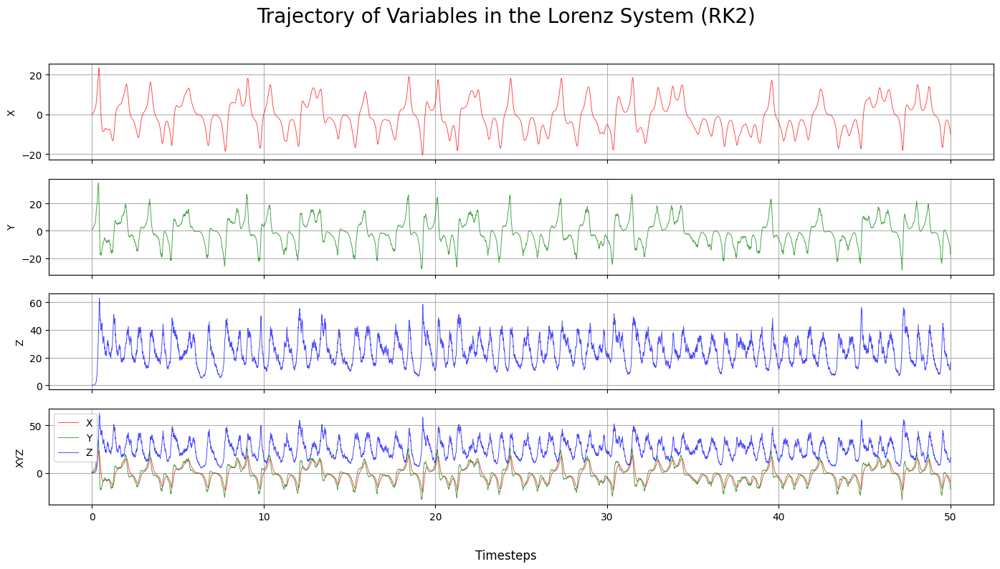

In [392]:
E = 0.06
INITIAL_STATE = [0, 1, 0]

solve_by_rk2_v2(SIGMA, RHO, BETA, E, INITIAL_STATE)

By increasing the amount of noise added to the system, we can then observe an erratic model that displays total chaos and unpredictability. In the x-y phase plane, we can still observe some level of resemblence to the actual Lorenz Attractor in terms of shape and form. However, the existence of the equilibrium points becomes more and more abstract, as the trajectories start to fill up space more irregularly. Looking at the plot of variable dynamics, we can also see that the noise has a more significant effect on $z$, the distortion from linearity in the vertical temperature profile, which means the sytem would go through less natural convective motions.

As mentioned previously, the components of the Lorenz System are, not only dependent on initial conditions, but on each other as well. This means the components have a combined effect on one another, and the effect on one component is not sourced from just a single other component. Thus, when introducing randomness, we must consider adding this randomness to the system as a whole. In our example, we have done so in the form of noise. This noise is the combined product of all external sources that affects the trajectory of the system.

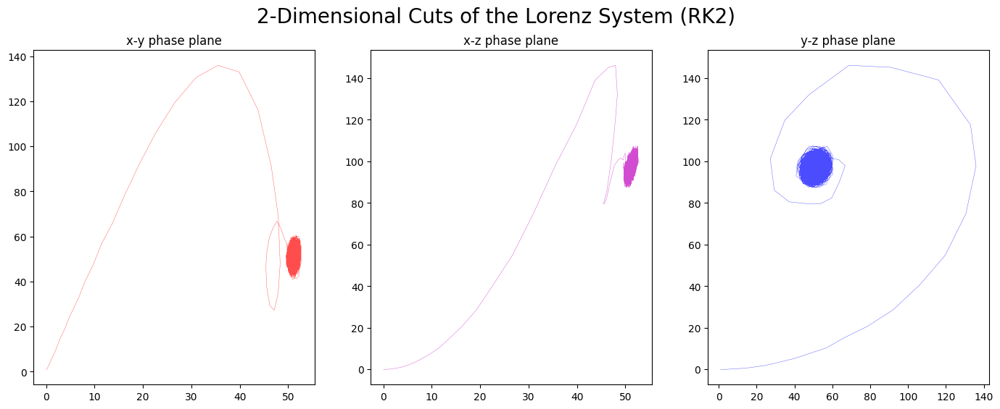

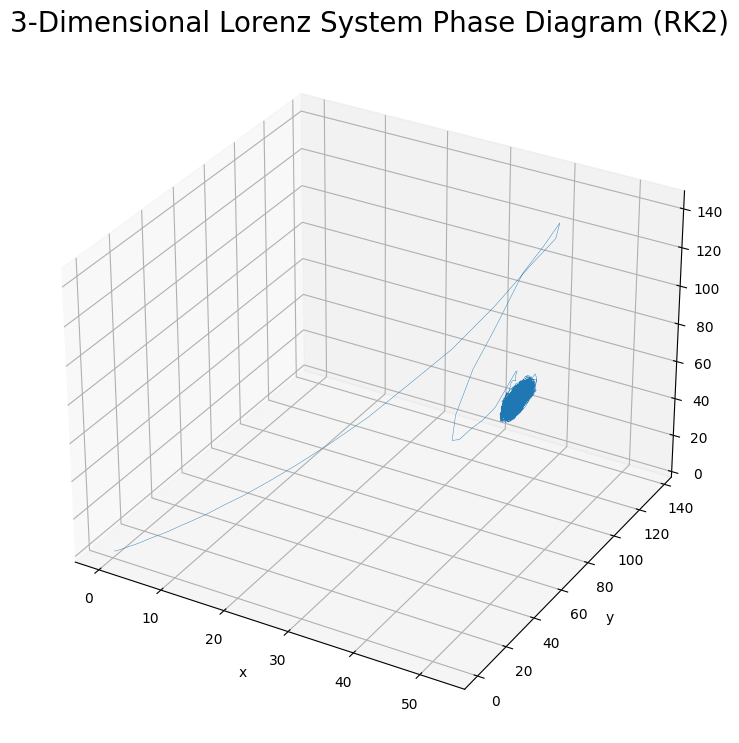

Values at the last timestep:  (51.489917565376544, 48.80864509545185, 96.47113587202416)


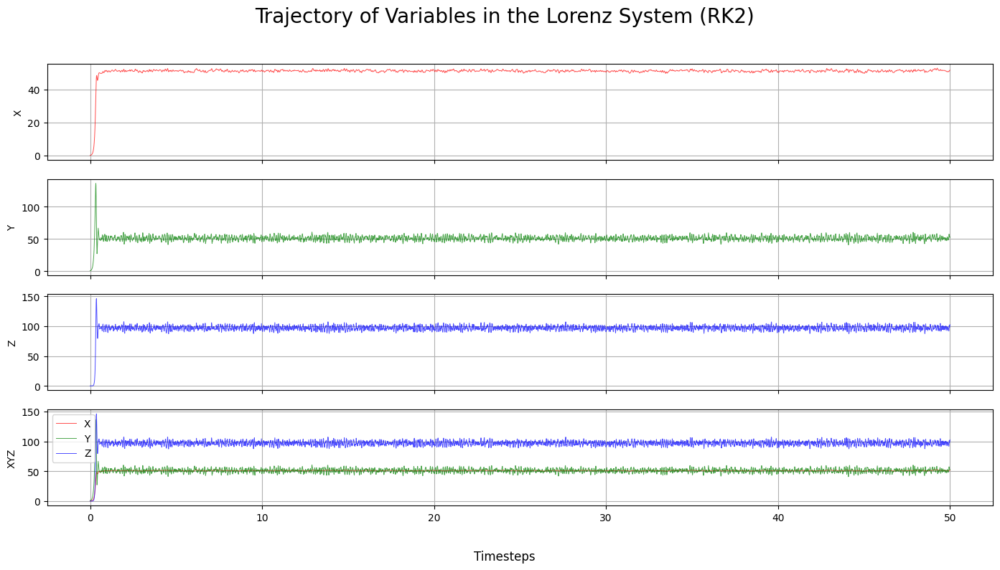

In [393]:
SIGMA = 4.5
RHO = 98
BETA = 27
E = 0.02
INITIAL_STATE = [0, 1, 0]

solve_by_rk2_v2(SIGMA, RHO, BETA, E, INITIAL_STATE)

When introducing noise to this the Lorenz system under this set of initial parameters, the previously determined asymptotic point of convergence also becomes more abstract as the system chaotically oscillates around this point.

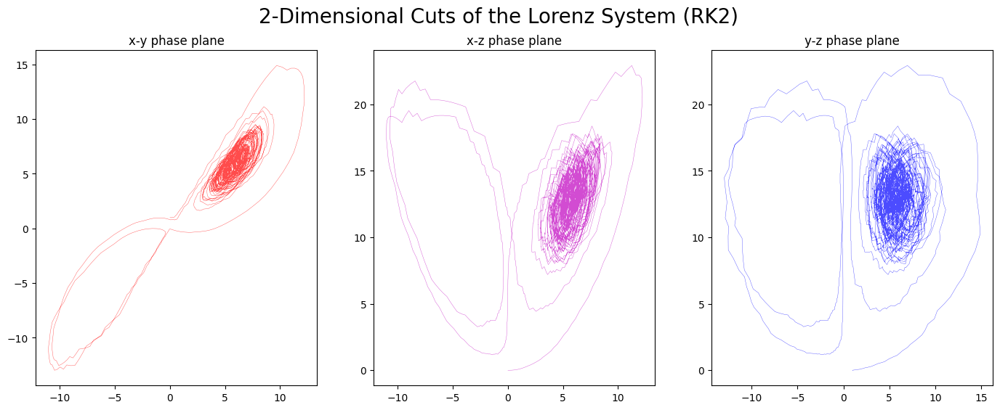

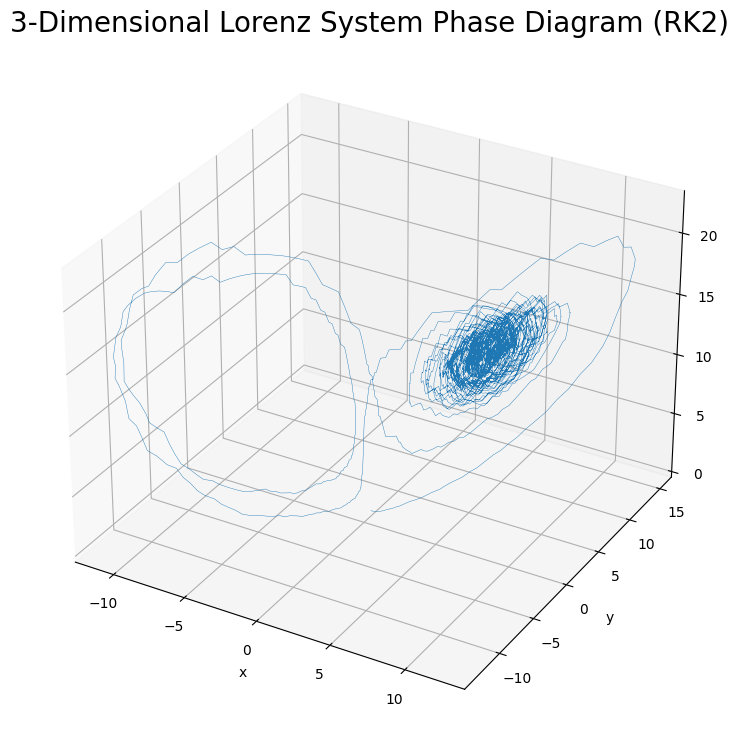

Values at the last timestep:  (5.63310337243031, 6.247915981976392, 11.818433068749611)


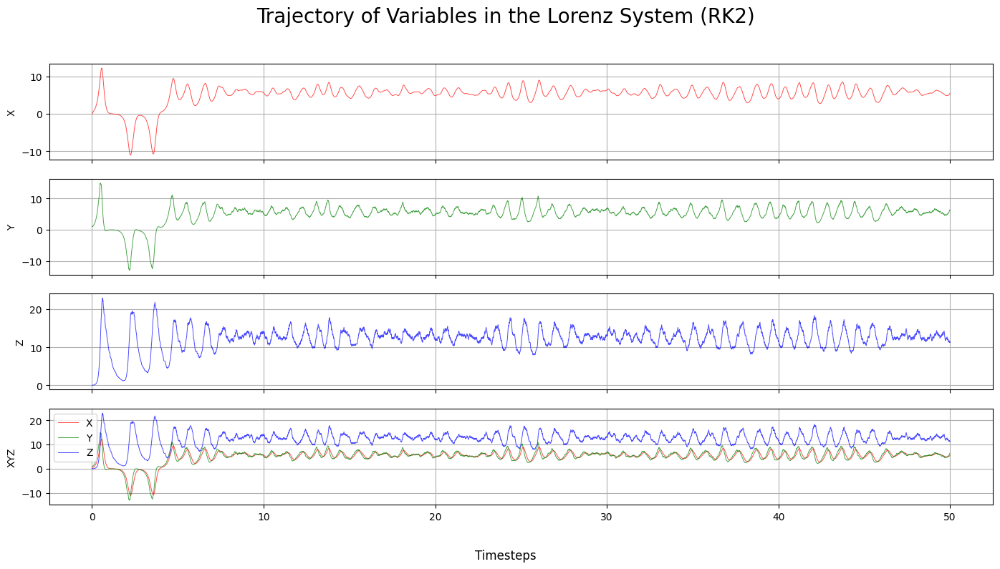

In [394]:
# Lorenz Attractor by RK2
SIGMA = 10.0
RHO = 13.926
BETA = 8.0/3.0
E = 0.02
INITIAL_STATE = [0, 1, 0]

solve_by_rk2_v2(SIGMA, RHO, BETA, E, INITIAL_STATE)

Under this set of initial parameters, we had shown previously that the deterministic Lorenz System would converge towards a steady state. However with the introduction of noise to the system, the system will struggle to reach said steady state. Even though the conditions given state that the system should be stable, that is, $\rho$ is below its critical value, the influence of external factors make the system more chaotic and behave erratically. As the plot of variable dynamics show, the variables seems to no longer converge towards some value.

It is also worth noting that, even though noise was directly added to the values of $x$, the trajectory of $x$ still displays the effects of the noises from $y$ and $z$, showing the variables' dependencies on one another. Lastly, the trend that has been constant throughout all the models discussed, is that all three variables increase and decrease along with each other. Granted, their values change at different rates and magnitudes, but even with the introduction of noise, the growth of one variable always indicate the growth of the other two, and vice versa.

### Part 5 (6 marks) - Steady State Analysis

Some dynamical systems will eventually converge to a steady state, where the rate of change for each compartment is 0. 

Does your model have any steady states? If so, where are they located? How stable are they? Why?

We have seen a number of methods for analysing steady states, including;
* Cobwebbing
* Phase Plane Analysis
* Linearisation about the steady state
* Local stability analysis
* Plotting the dynamics with a very long time horizon

Consider which of these techniques are appropriate to apply when analysing your model's steady states. Justify your use (or lack of use) of said methods, and explain what your results mean. 

The Lorenz System is a system of three differential equations, with three variables. This produces a 3-dimensional model (in reality the system can be strange and have a fractal structure i.e. Lorenz Attractor). As such, steady analysis techniques like Cobwebbing and phase plane analysis, while potentially applicable, do not provide enough visual clarity, especially with the limitations of the IDE. Therefore, the clearest and the most straightforward method of analyzing the steady states, would be through plotting the dynamics with a very long time horizon.

As discussed previously, the system when $\sigma = 10$ and $\beta = \frac{8}{3}$, has a critcal value $\rho$ of around $24.74$. Therefore, if we set $\rho$ to be a value such as $22.2$, we should be able to observe convergence towards the steady state. We will first plot the system to see what the model would look like.

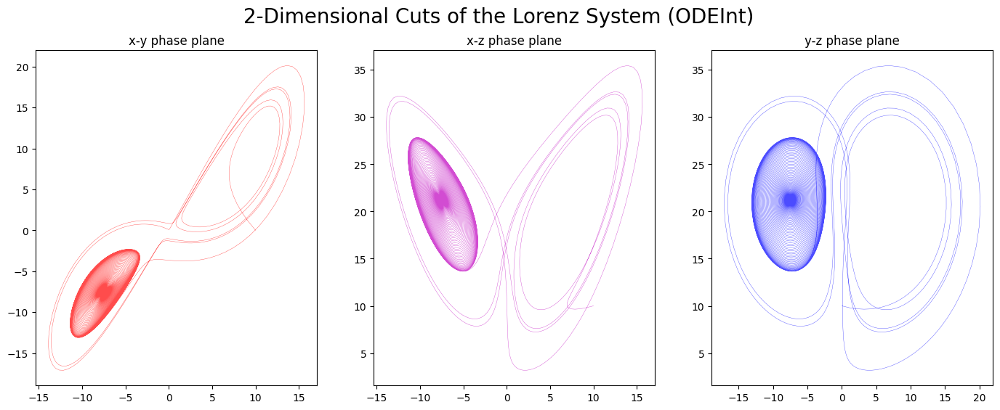

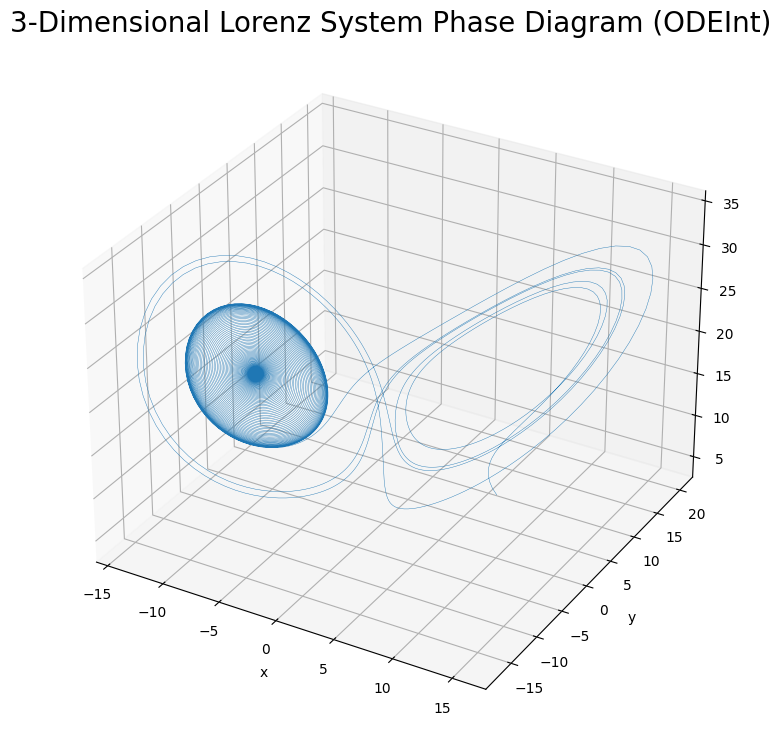

In [395]:
TIMESTEPS = np.linspace(0, 100, 10000)

SIGMA = 10.0
RHO = 22.2
BETA = 8.0/3.0
INITIAL_STATE = (10, 0, 10)

x, y, z = solve_by_odeint(TIMESTEPS, INITIAL_STATE)
plot_2d(x, y, z, ODEINT)
plot_3d(x, y, z, ODEINT)

We can see that the model is slightly taking on the shape and form of a Lorenz Attractor, when $\rho = 28$. However, we can oabserve a convergence towards the fixed_point $C_N$. We will now look into whether or not it is indeed a steady state, and its stability by looking at the dynamics of the system.

Values at the last timestep:  (-7.51489031968317, -7.506922811459055, 21.20706043448108)


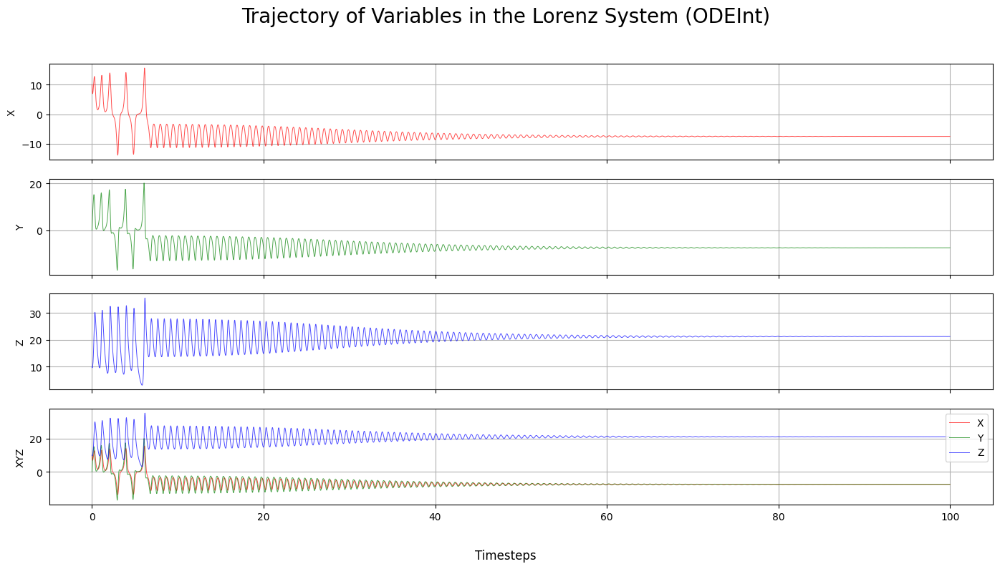

In [396]:
plot_variables(TIMESTEPS, [x, y, z], ODEINT)

As the plot shows, each variables oscillates around some value as it converges towards it. The oscillation occurs as the trajectory spiral around the fixed point as shown in the 3-dimensional model above. We can prove that this is a steady state through two methods, with the first being plotting two trajectories, with different initial states, and plot the differences of their variables.

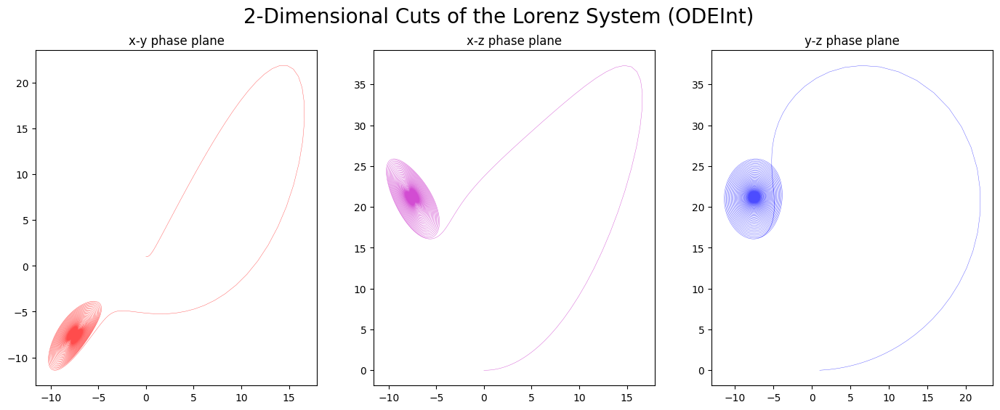

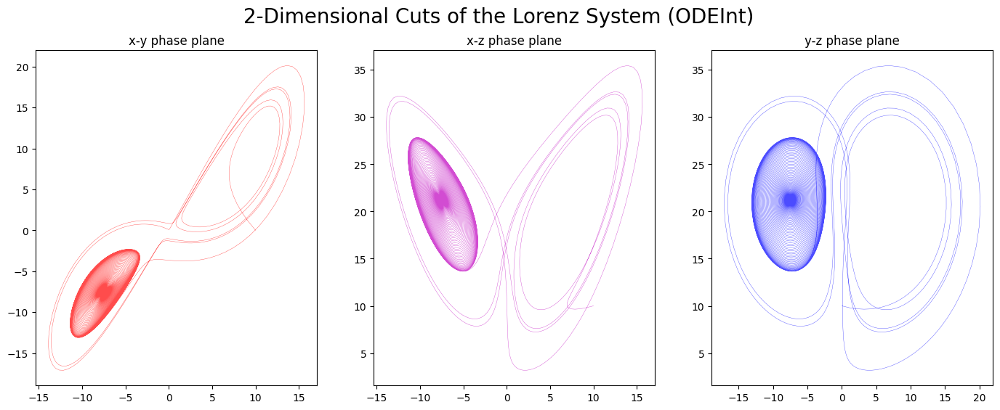

In [397]:
initial_state1 = (0, 1, 0)
initial_state2 = (10, 0, 10)

x1, y1, z1 = solve_by_odeint(TIMESTEPS, initial_state1)
x2, y2, z2 = solve_by_odeint(TIMESTEPS, initial_state2)

plot_2d(x1, y1, z1, ODEINT)
plot_2d(x2, y2, z2, ODEINT)

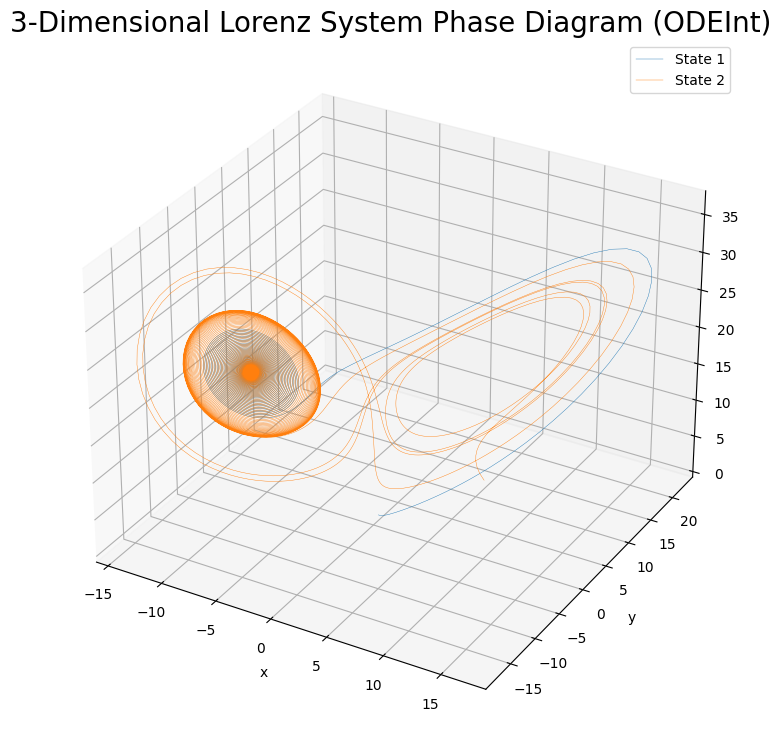

Values at the last timestep:  (0.0026139049150595284, 0.010383621139467003, 0.008290381083615017)


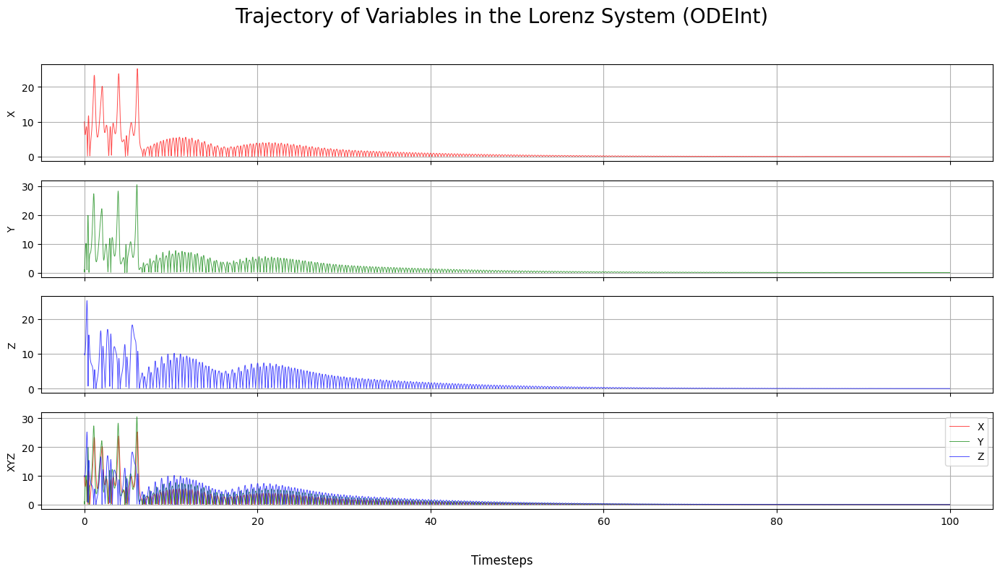

In [398]:
plot_double([x1, x2], [y1, y2], [z1, z2], ODEINT)
plot_variables(TIMESTEPS, [abs(x1-x2), abs(y1-y2), abs(z1-z2)], ODEINT)

For all three variables, we can observe that after some time, the differences between their respective components approach $0$, because they are reaching the same fixed point steady state. This also means that given the same initial parameters, the initial states simply determine which fixed point, $C_P$ or $C_N$ would the trajectory converge towards, and how long before it converges. 

For the second method in showing this fixed point's stability, by plotting the system when the initial state is the exact value of the steady state. The fixed points, or the points of equilibrium can be calculated with the expression $(\pm{\sqrt{\beta(\rho-1)}}, \pm{\sqrt{\beta(\rho-1)}}, \rho-1)$ (https://users.math.yale.edu/users/sa563/Papers/WAWW_StoLorenz.pdf). With this set of parameters, the steady state can be calculated to be at the coordinates $(\pm\sqrt{\frac{848}{15}}, \pm\sqrt{\frac{848}{15}}, \frac{106}{5})$. Therefore, if we were to set the initial state to be equal to this value, the trajectory wouldn't exist as the system is already stable.

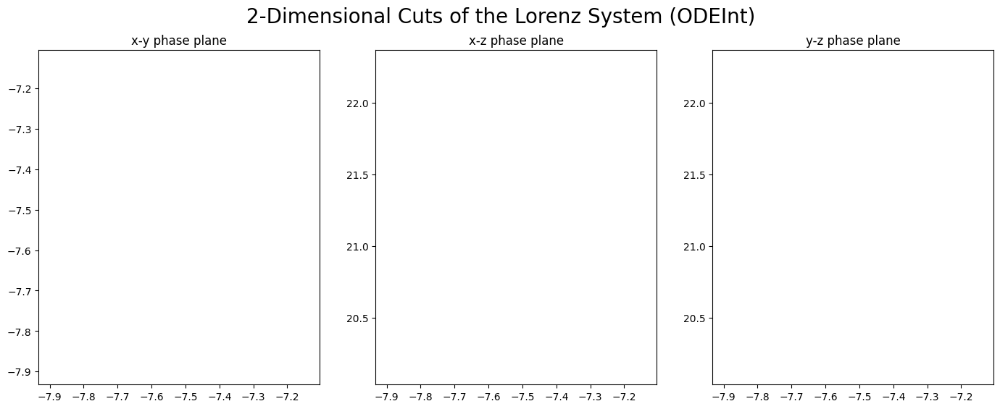

In [399]:
INITIAL_STATE = (-(848/15)**0.5, -(848/15)**0.5, 106/5)

x, y, z = solve_by_odeint(TIMESTEPS, INITIAL_STATE)

plot_2d(x, y, z, ODEINT)


As $\rho$ approaches the critical value, we can also show that the system becomes increasingly sensitive to initial conditions. If we now set $\rho$ to be $23$, The resulting model looks even closer to the Lorenz Attractor, but more importantly, the system is no longer stable and does not converge towards the steady state when the initial state is at $(10, 0, 10)$, even though $\rho$ is still less than the critical value.

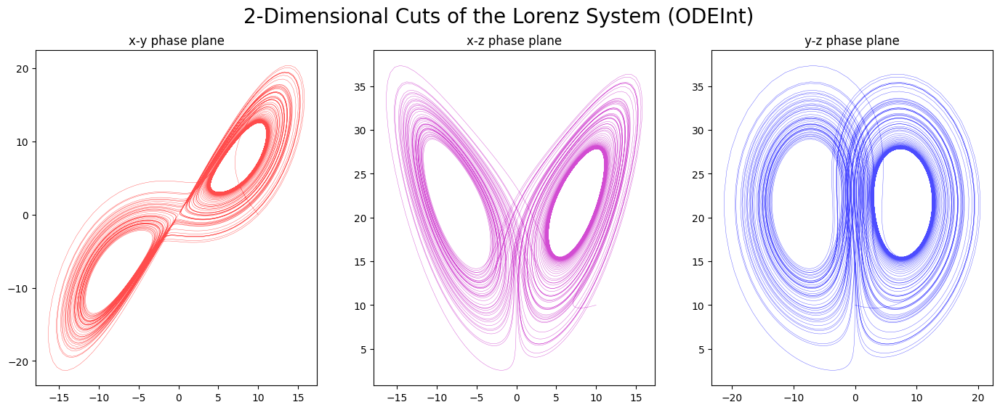

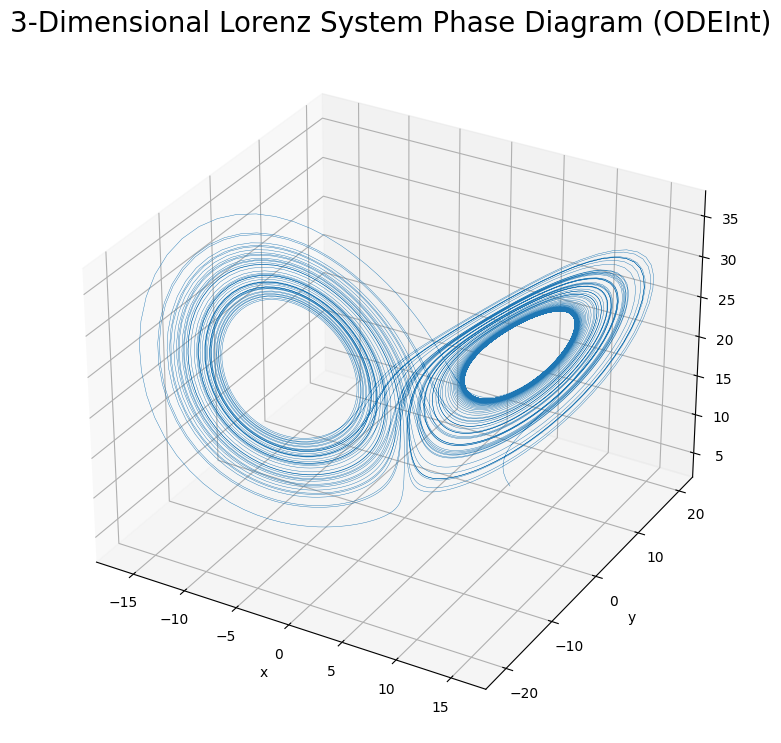

Values at the last timestep:  (-2.523927629002763, -1.9060079964410488, 17.923913697131233)


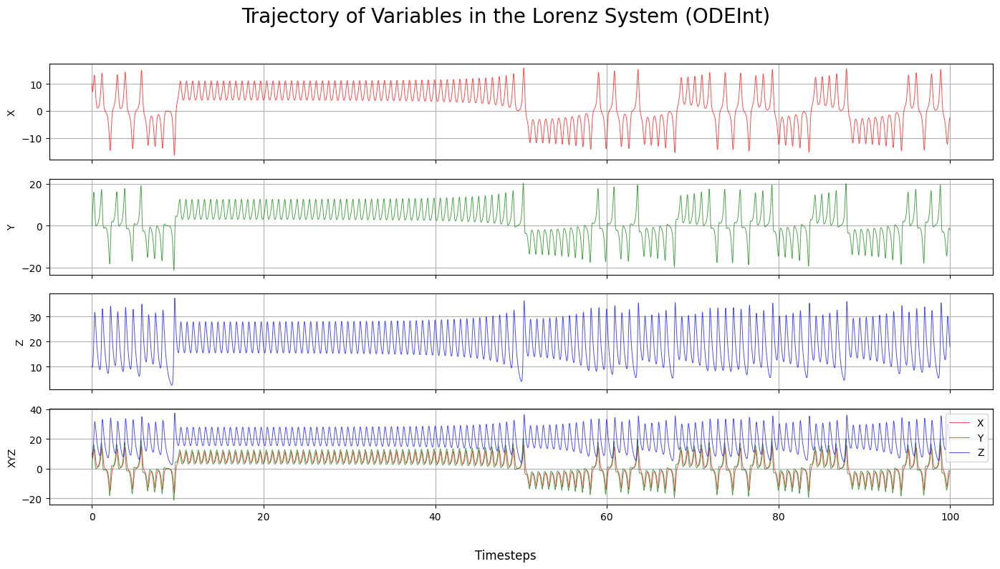

In [400]:
SIGMA = 10.0
RHO = 23
BETA = 8.0/3.0
INITIAL_STATE = (10, 0, 10)

x, y, z = solve_by_odeint(TIMESTEPS, INITIAL_STATE)
plot_2d(x, y, z, ODEINT)
plot_3d(x, y, z, ODEINT)
plot_variables(TIMESTEPS, [x, y, z], ODEINT)

The plot of the dynamics shows the chaos in each variable's trajectory. However, if we were to keep the same parameters and change the initial state a little to $(0, 1, 0)$, the model will change drastically once more.

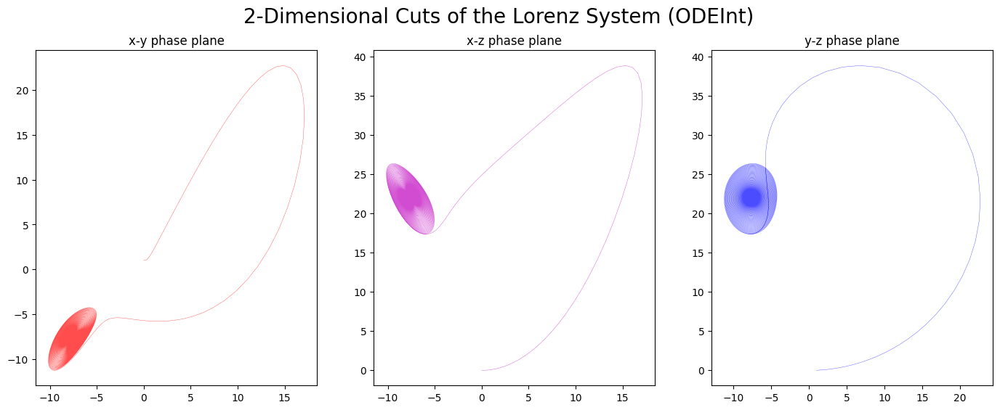

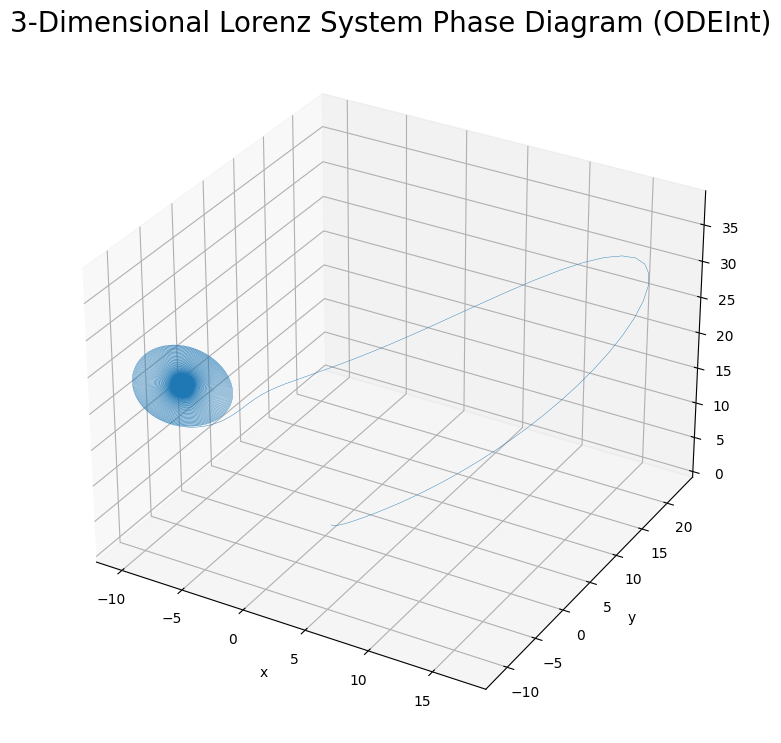

Values at the last timestep:  (-7.663124169730588, -7.679288604688874, 21.981188548352943)


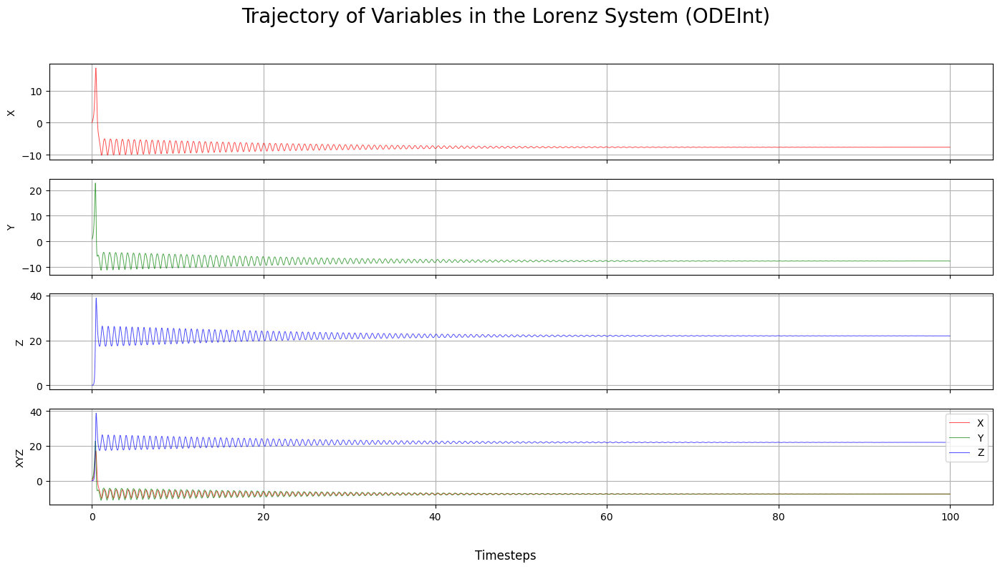

In [401]:
SIGMA = 10.0
RHO = 23
BETA = 8.0/3.0
INITIAL_STATE = (0, 1, 0)

x, y, z = solve_by_odeint(TIMESTEPS, INITIAL_STATE)
plot_2d(x, y, z, ODEINT)
plot_3d(x, y, z, ODEINT)
plot_variables(TIMESTEPS, [x, y, z], ODEINT)

In previous models, when $\rho$ is far away from the critical value, changing the initial state only changes the time it takes for the model to converge and which of the two fixed points it converges to (if the system is stable). This time, we can once again observe each variable converging towards some value.

Lastly, to further demonstrate the chaos and instability, we can look at the system when $\rho$ is greater than $24.74$, even just slightly, at the value of $25$.

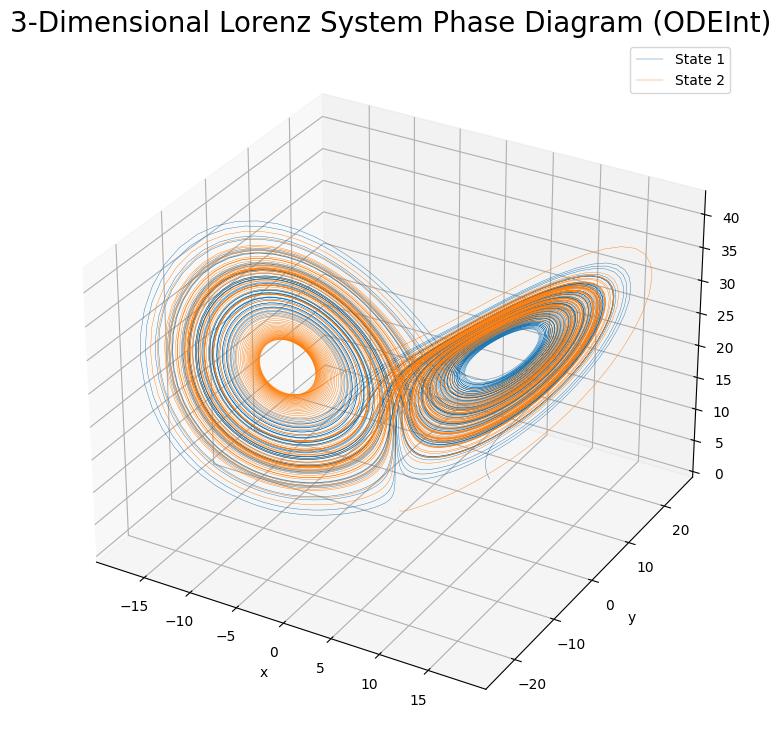

Values at the last timestep:  (5.40317695449458, 4.116341854102008, 18.151547651900785)


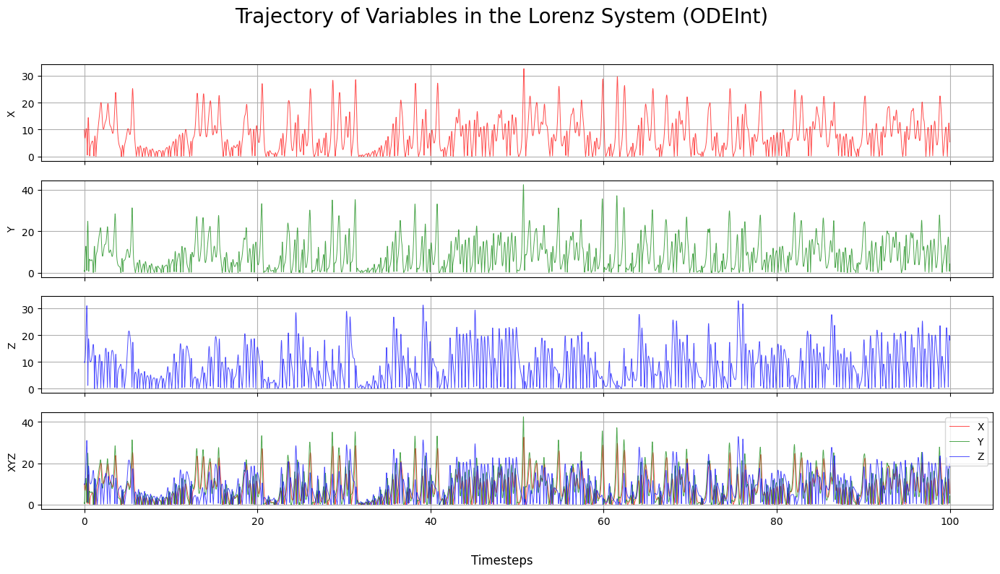

In [402]:
SIGMA = 10.0
RHO = 25
BETA = 8.0/3.0
initial_state1 = (10, 0, 10)
initial_state2 = (0, 1, 0)

x1, y1, z1 = solve_by_odeint(TIMESTEPS, initial_state1)
x2, y2, z2 = solve_by_odeint(TIMESTEPS, initial_state2)

plot_double([x1, x2], [y1, y2], [z1, z2], ODEINT)
plot_variables(TIMESTEPS, [abs(x1-x2), abs(y1-y2), abs(z1-z2)], ODEINT)

For both of the initial states that determined whether the system was stable or not at $\rho=23$, the system is now unstable and chaos takes over. This level of instability shows the increasing sensitivity of the Lorenz System to initial conditions when $\rho$ approaches the critical value. It shows the disproportionally large effects when in correspondence to small changes in initial conditions.

The physical explanation for this sensitivity could be seen as such. The critical value of $\rho$ essentially determines when convection dominates over conduction. Since $\sigma$, the momentum diffusivity, is much greater than $1$, any convection that takes place will introduce more chaos to the system. As the value of $\rho$ increases to the critical value, the value of $\sigma$ therefore becomes more and more significant, until $\rho$ surpasses the critical value, then convection has total dominance and the system becomes completely unstable and chaotic. At a value less than the critical value but extremely close, convection is still a significant force in the system, but there still exists initial states that allow the system to converge towards stability. Therefore, in the previous model when $\rho$ has a value of $13.926$, much less than the critical value, changing the initial states only affected how long and which of the fixed points the trajectory converged to. 